In [7]:
# TODO
# dhdt best fit
# Save output of trend array for replotting later (or upload to cryocloud tutorial?)
# Plot time series of on- and off- lake points to demonstrate that lakes wouldn't have clear long-term trend
# where you do see dhdt trend over lakes, see if that lake has a draining or filling trend over time period
# Zoom in's of interesting regions

In [8]:
# Code to Fig. 3 of Sauthoff and others, 2024
# This code run continental-scale operations on multiple datasets and
# requires a XX GB server or local memory
#
# Written 2023-10-11 by W. Sauthoff (wsauthoff.github.io)

In [ ]:
test

In [ ]:
test

In [ ]:
test

In [ ]:
test

# Setup computing environment

# Setup computing environment

In [9]:
%pip install openpyxl

Note: you may need to restart the kernel to use updated packages.


In [1]:
# Import libraries
from datetime import datetime
import earthaccess
import geopandas as gpd
import matplotlib.colors as mpl_colors
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable
import numpy as np
import os
from pyproj import CRS, Transformer
import rioxarray
from scipy.stats import linregress
from skimage import measure
import time
import warnings
import xarray as xr

# Magic functions
%matplotlib widget

# Define data directories dependent on home environment
if os.getenv('HOME') == '/home/jovyan':
    DATA_DIR = '/home/jovyan/data'
    SCRIPT_DIR = '/home/jovyan/repos_my/scripts'
    OUTPUT_DIR = '/home/jovyan/1_outlines_candidates/output/'
    
# Define constants and coordinate transforms for the geodesic area calculation
CRS_LL = "EPSG:4326"  # wgs84 in lon,lat
GEOD = CRS(CRS_LL).get_geod()  # geod object for calculating geodesic area on defined ellipsoid
CRS_XY = "EPSG:3031"  # Antarctic Polar Stereographic in x, y
XY_TO_LL = Transformer.from_crs(CRS_XY, CRS_LL, always_xy = True)  # make coord transformer

# Change default font to Arial and increase font size
# plt.rcParams["font.family"] = 'Arial'
plt.rcParams.update({'font.size': 20})

# Import datasets

In [11]:
# Import subglacial lake outline inventories
exec(open('0_lake_locations.py').read())

Smith and others, 2009, J. Glac., doi:10.3189/002214309789470879
97
Fricker & Scambos, 2009, J. Glac., doi:10.3189/002214309788608813
7
McMillan and others, 2013, GRL, doi:10.1002/grl.50689
1
Kim and others, 2016, TC, doi:10.5194/tc-10-2971-2016
3
Carter and others, 2013, J. Glac., doi:10.3189/2013JoG13J085
1
Fricker and others, 2010, J. Glac., doi:10.3189/002214310791968557
8
Fricker and others, 2014, J. Glac., doi:10.3189/2014JoG14J063
9
Siegfried & Fricker, 2018, Ann. Glac., doi:10.1017/aog.2017.36
1
Smith and others, 2017, TC, doi:10.5194/tc-11-451-2017
4
Gray et al. (2005); Smith et al. (2009)
2
Wingham et al. (2006); Surveyed by ICECAP in 2008/09 (Wright et al., 2012)
1
Wingham et al. (2006)
4
Fricker et al. (2007), Blankenship et al. (2009), Siegfried et al., (2014), Siegfried & Fricker (2018)
1
Fricker et al. (2007); Siegfried et al. (2014); Siegfried & Fricker (2018)
1
Lake Engelhardt (Fricker et al., 2007); Carter et al., (2013); Siegfried & Fricker (2018)
1
Fricker et al. (2

In [12]:
# Log into NASA Earthdata to search for datasets
earthaccess.login()

In [13]:
# Find ICESat-2 ATL14 data granules
results = earthaccess.search_data(
    short_name='ATL14',
    version='003',
    cloud_hosted=True,
    bounding_box=(180, -90, -180, -60)  # (lower_left_lon, lower_left_lat , upper_right_lon, upper_right_lat))
)

Granules found: 4


In [14]:
# Open data granules as s3 files to stream
files = earthaccess.open(results)

Opening 4 granules, approx size: 10.78 GB
using provider: NSIDC_CPRD


QUEUEING TASKS | :   0%|          | 0/4 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/4 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/4 [00:00<?, ?it/s]

In [15]:
files

[<File-like object S3FileSystem, nsidc-cumulus-prod-protected/ATLAS/ATL14/003/ATL14_A3_0318_100m_003_01.nc>,
 <File-like object S3FileSystem, nsidc-cumulus-prod-protected/ATLAS/ATL14/003/ATL14_A2_0318_100m_003_01.nc>,
 <File-like object S3FileSystem, nsidc-cumulus-prod-protected/ATLAS/ATL14/003/ATL14_A4_0318_100m_003_01.nc>,
 <File-like object S3FileSystem, nsidc-cumulus-prod-protected/ATLAS/ATL14/003/ATL14_A1_0318_100m_003_01.nc>]

In [16]:
# Open each file, which are quadrants in polar stereographic coordinations around the Geographic South Pole
ATL14_A1 = xr.open_dataset(files[3])
ATL14_A2 = xr.open_dataset(files[1])
ATL14_A3 = xr.open_dataset(files[0])
ATL14_A4 = xr.open_dataset(files[2])

In [17]:
# Specify the variables to keep
variables_to_keep = ['time', 'y', 'x', 'h']

# List of xarray datasets
datasets = [ATL14_A1, ATL14_A2, ATL14_A3, ATL14_A4]

# Function to drop variables not in variables_to_keep from a dataset
def drop_unwanted_variables(dataset):
    variables_to_drop = [var for var in dataset.variables if var not in variables_to_keep]
    return dataset.drop_vars(variables_to_drop)

# Apply the function to each dataset
ATL14_A1, ATL14_A2, ATL14_A3, ATL14_A4 = [drop_unwanted_variables(ds) for ds in datasets]

In [18]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL14_A12 = xr.concat([ATL14_A2.isel(x=slice(0,-1)), ATL14_A1], dim="x")

In [19]:
del ATL14_A1, ATL14_A2

In [20]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL14_A34 = xr.concat([ATL14_A3.isel(x=slice(0,-1)), ATL14_A4], dim='x')

In [21]:
# Delete variables to reduce memory consumption
del ATL14_A3, ATL14_A4

In [22]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL14 = xr.concat([ATL14_A34.isel(y=slice(0,-1)), ATL14_A12], dim='y')

In [23]:
# Delete variables to reduce memory consumption
del ATL14_A12, ATL14_A34

In [ ]:
# Find ICESat-2 ATL15 data granules
results = earthaccess.search_data(
    doi='10.5067/ATLAS/ATL15.003',
    # short_name='ATL15',
    # version='003',
    cloud_hosted=True,
    bounding_box=(180, -90, -180, -60)  # (lower_left_lon, lower_left_lat , upper_right_lon, upper_right_lat))
)

In [ ]:
# Open data granules as s3 files to stream
files = earthaccess.open(results)

In [ ]:
files

In [ ]:
# After viewing files, index the files you wish to open
print(files[15])
print(files[3])
print(files[9])
print(files[11])

In [ ]:
# Open each file, which are quadrants in polar stereographic coordinations around the Geographic South Pole
ATL15_A1 = xr.open_dataset(files[15], group='delta_h')
ATL15_A2 = xr.open_dataset(files[3], group='delta_h')
ATL15_A3 = xr.open_dataset(files[9], group='delta_h')
ATL15_A4 = xr.open_dataset(files[11], group='delta_h')

In [ ]:
# Specify the variables to keep
variables_to_keep = ['time', 'y', 'x', 'delta_h']

# List of xarray datasets
datasets = [ATL15_A1, ATL15_A2, ATL15_A3, ATL15_A4]

# Function to drop variables not in variables_to_keep from a dataset
def drop_unwanted_variables(dataset):
    variables_to_drop = [var for var in dataset.variables if var not in variables_to_keep]
    return dataset.drop_vars(variables_to_drop)

# Apply the function to each dataset
ATL15_A1, ATL15_A2, ATL15_A3, ATL15_A4 = [drop_unwanted_variables(ds) for ds in datasets]

In [ ]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL15_A12 = xr.concat([ATL15_A2.isel(x=slice(0,-1)), ATL15_A1], dim="x")

In [ ]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL15_A34 = xr.concat([ATL15_A3.isel(x=slice(0,-1)), ATL15_A4], dim='x')

In [ ]:
# Use xarray concatenation to stitch two quadrants togethers
# Use xarray index selecting to occlude the duplicated x=0 vector of data
ATL15 = xr.concat([ATL15_A34.isel(y=slice(0,-1)), ATL15_A12], dim='y')

In [ ]:
# Delete variables to reduce memory consumption
del ATL15_A1, ATL15_A12, ATL15_A2, ATL15_A3, ATL15_A34, ATL15_A4

In [ ]:
# Add datasets attributes
ATL15.attrs['identifier_product_DOI'] = '10.5067/ATLAS/ATL15.003'
ATL15.attrs['shortName'] = 'ATL15'

In [ ]:
# Assign new data variable of absolute heights (ATL14 DEM + ATL15 dh) to ATL15_dh xarray.Dataset
ATL15 = ATL15.assign(h = ATL15['delta_h'] + ATL14['h'][:,:])
ATL15

In [ ]:
# Scripps Grounding Line
# https://doi.pangaea.de/10.1594/PANGAEA.819147
Scripps_gl = gpd.read_file(DATA_DIR + 
    '/boundaries/Depoorter2013/Antarctica_masks/scripps_antarctica_polygons_v1.shp')

# Isolate only land ice
Scripps_landice = Scripps_gl[Scripps_gl['Id_text'] == 'Grounded ice or land']

In [ ]:
# Clip ATL14/15 to grounding line to limit analysis to only below grounded ice
# ATL14.rio.write_crs("epsg:3031", inplace=True)
ATL15.rio.write_crs("epsg:3031", inplace=True)
# ATL14 = ATL14.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs)
# ATL15 = ATL15.rio.clip(Scripps_landice.geometry.values, Scripps_landice.crs)
# temp: not clipping to view ice shelf dhdt for matt

In [ ]:
# Find cloud-hosted MEaSUREs Phase-Based Antarctica Ice Velocity Map, Version 1
# DOI from https://nsidc.org/data/NSIDC-0754/versions/1
results = earthaccess.search_data(
    doi='10.5067/PZ3NJ5RXRH10',
    cloud_hosted=True,
    bounding_box=(180, -90, -180, -60)  # (lower_left_lon, lower_left_lat , upper_right_lon, upper_right_lat))
)

In [ ]:
# Open data granules as s3 files to stream
files = earthaccess.open(results)
files

In [ ]:
# Print file name to ensure expected dataset
print(files[0])

In [ ]:
# Open each file, which are quadrants in polar stereographic coordinations around the Geographic South Pole
ice_vel = xr.open_dataset(files[0])
ice_vel

In [ ]:
# Specify the variables to keep
variables_to_keep = ['x', 'y', 'VX', 'VY']

variables_to_drop = [var for var in ice_vel.variables if var not in variables_to_keep]

# Drop variables to reduce memory consumption
ice_vel = ice_vel.drop_vars(variables_to_drop)
ice_vel

In [ ]:
# Calculate velocity magnitude
vel_mag = (ice_vel['VX']**2 + ice_vel['VY']**2)**0.5

In [ ]:
del ice_vel

In [ ]:
# Import MODIS MOA 2014 coastline and grounding line for plotting inset maps
# https://nsidc.org/data/nsidc-0730/versions/1
shp = DATA_DIR + '/boundaries/MODIS_MOA/2014/moa2014_coastline_v01.shp' 
moa_2014_coastline = gpd.read_file(shp)
shp = DATA_DIR + '/boundaries/MODIS_MOA/2014/moa2014_grounding_line_v01.shp' 
moa_2014_groundingline = gpd.read_file(shp)

In [ ]:
# Import MODIS Mosaic of Antarctica surface imagery
# https://nsidc.org/data/nsidc-0730/versions/1
# Relocate to data_dir
# Open into an xarray.DataArray
# moa_lowres = DATA_DIR + '/surface_imagery/MODIS_MOA/2014/moa750_2014_hp1_v01.tif' 
# moa_lowres_da = rioxarray.open_rasterio(moa_lowres)

# moa_highres = DATA_DIR + '/surface_imagery/MODIS_MOA/2014/moa125_2014_hp1_v01.tif' 
# moa_highres_da = rioxarray.open_rasterio(moa_highres)

In [25]:
# MEaSUREs Antarctic Boundaries for IPY 2007-2009 from Satellite Radar V002 (Mouginot and others, 2017)
# https://doi.org/10.5067/AXE4121732AD
# https://nsidc.org/sites/default/files/nsidc-0709-v002-userguide.pdf
IMBIE_basins = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/Basins_IMBIE_Antarctica_v02.shp')
refined_basins = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/Basins_Antarctica_v02.shp')
ice_boundaries = gpd.read_file(DATA_DIR + '/boundaries/measures_Antarctic_boundaries/IceBoundaries_Antarctica_v02.shp')
grounded_ice_boundaries = ice_boundaries[ice_boundaries["TYPE"]=='GR']

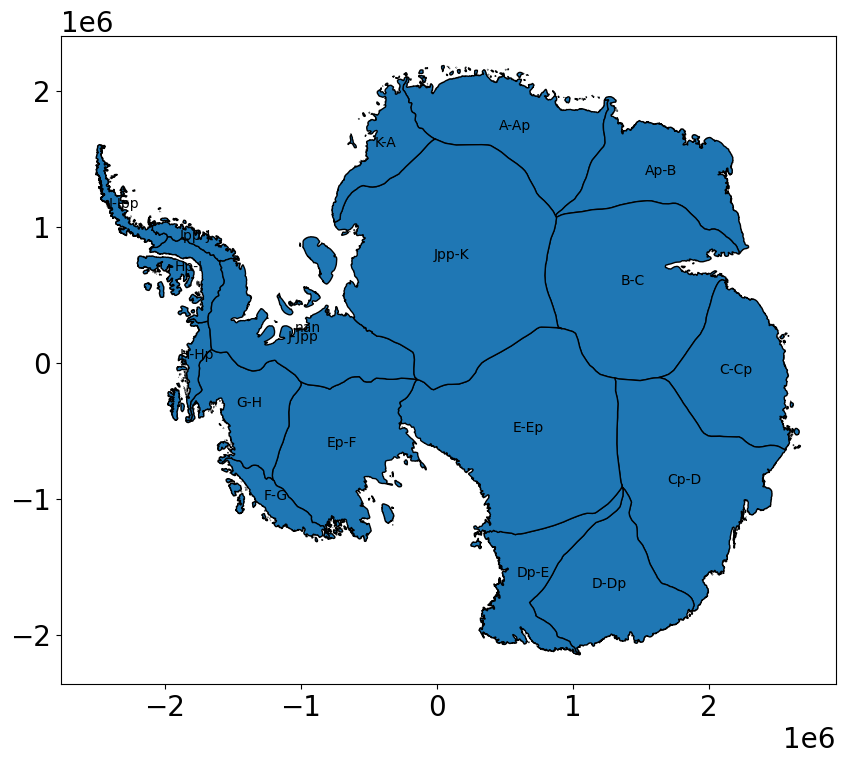

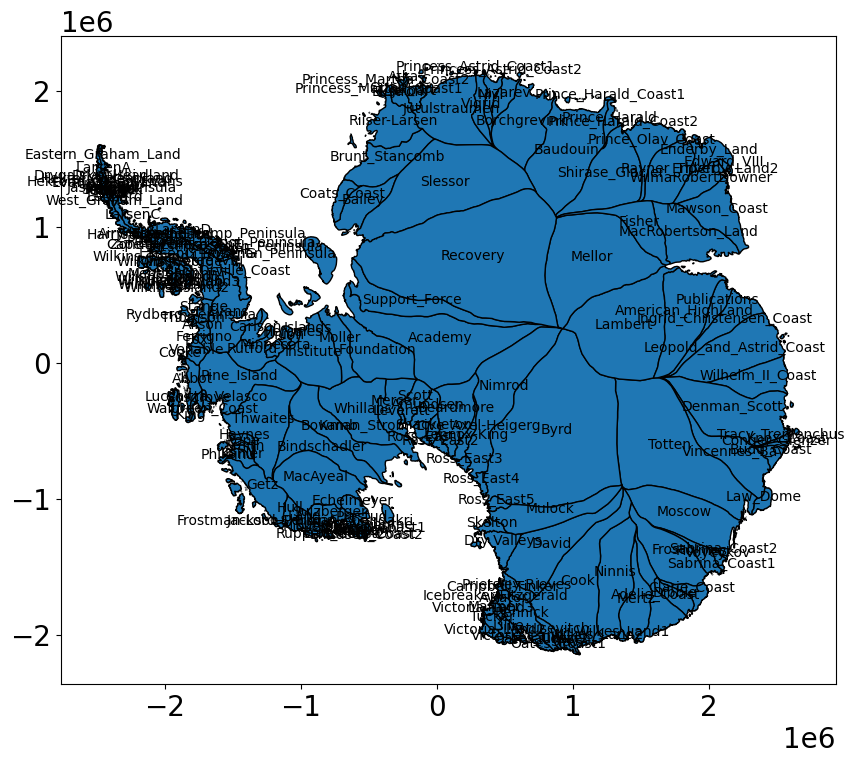

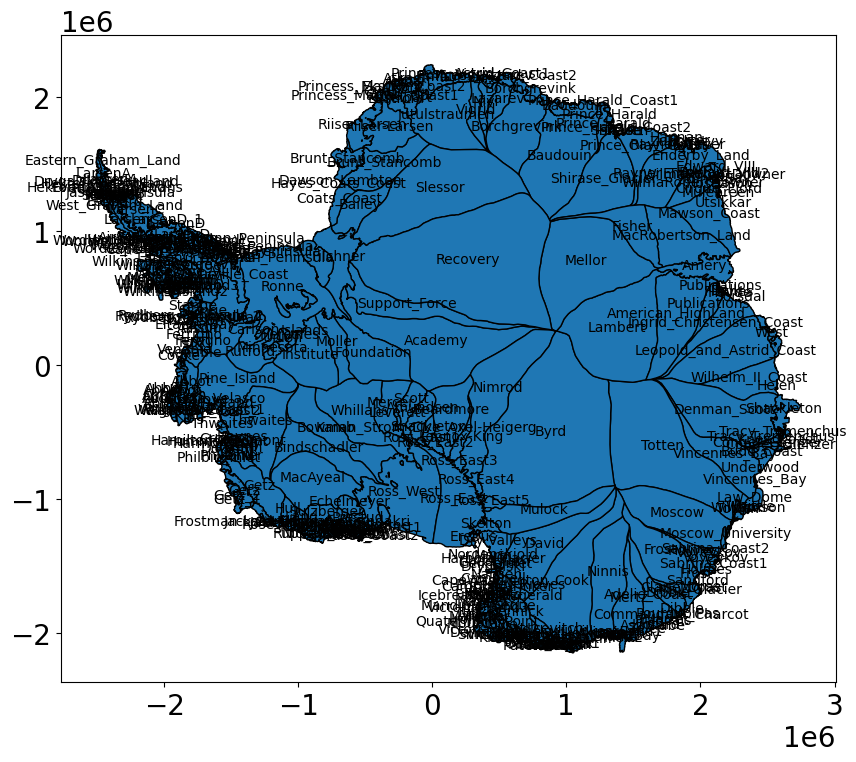

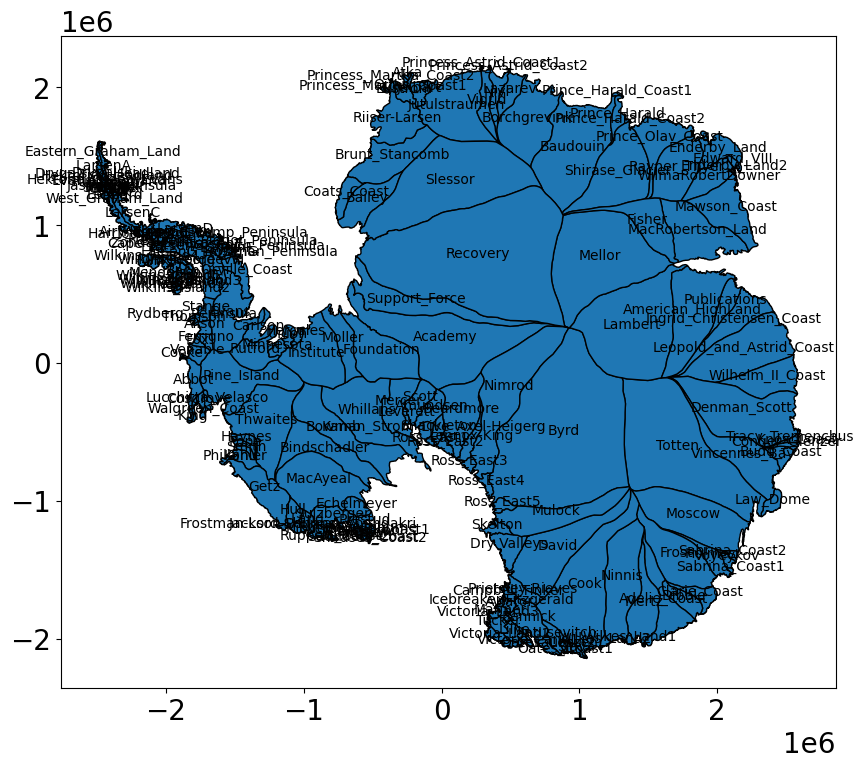

In [37]:
# Plotting basin polygons and labels
basins = [IMBIE_basins, 
    refined_basins, 
    ice_boundaries, 
    grounded_ice_boundaries]

# Loop through each basin in the list
for basin in basins:
    fig, ax = plt.subplots(figsize=(10, 10))

    basin.plot(ax=ax, edgecolor='k')  # Plot the current basin with a black edge color

    # Adding labels from the 'NAME' column for the current basin
    for idx, row in basin.iterrows():
        plt.annotate(text=row['NAME'], xy=(row['geometry'].centroid.x, 
                                           row['geometry'].centroid.y),
                     horizontalalignment='center', color='k', size=10)

    plt.show()
    plt.close()

<Axes: >

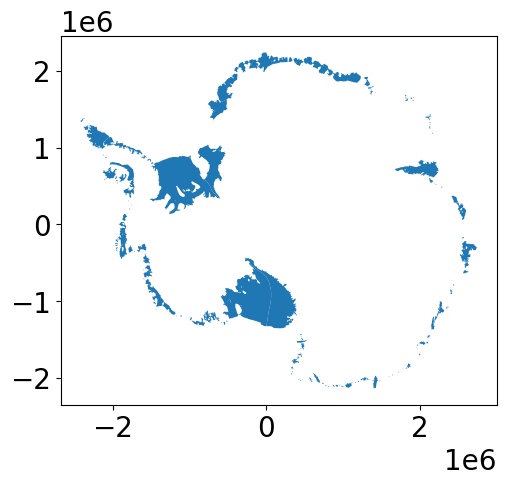

In [47]:
ice_boundaries[ice_boundaries.TYPE == 'FL'].plot()

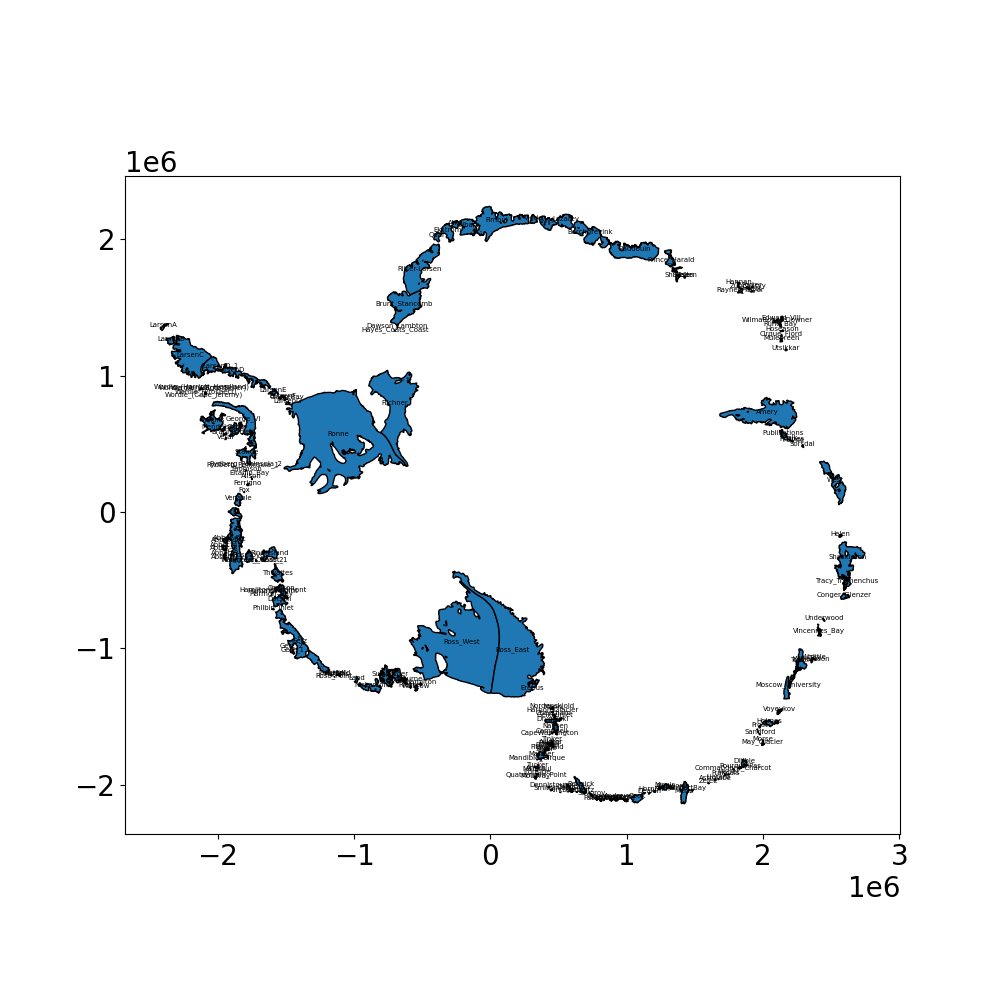

In [53]:
# Plotting polygons
fig, ax = plt.subplots(figsize=(10, 10))

basins = [IMBIE_basins, refined_basins, ice_boundaries, grounded_ice_boundaries]

ice_boundaries[ice_boundaries.TYPE == 'FL'].plot(ax=ax, edgecolor='k')

# Adding labels from the 'NAME' column
for idx, row in ice_boundaries[ice_boundaries.TYPE == 'FL'].iterrows():
    plt.annotate(text=row['NAME'], xy=(row['geometry'].centroid.x, 
                                       row['geometry'].centroid.y),
                 horizontalalignment='center', color='k', size=5)

plt.show()

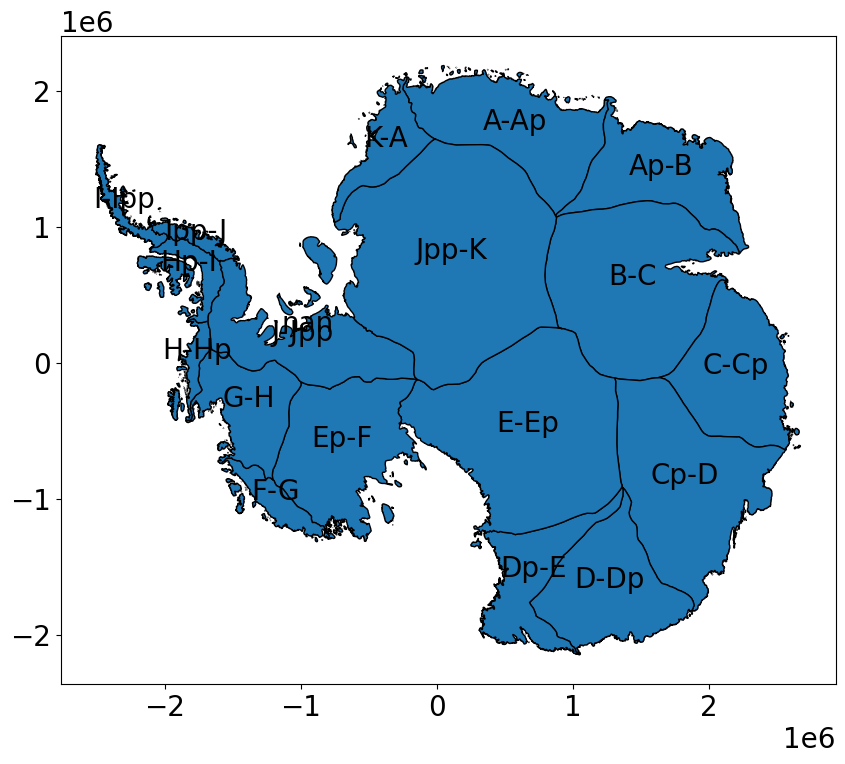

In [44]:
# Plotting polygons
fig, ax = plt.subplots(figsize=(10, 10))

basins = [IMBIE_basins, refined_basins, ice_boundaries, grounded_ice_boundaries]

IMBIE_basins.plot(ax=ax, edgecolor='k')

# Adding labels from the 'NAME' column
for idx, row in IMBIE_basins.iterrows():
    plt.annotate(text=row['NAME'], xy=(row['geometry'].centroid.x, 
                                       row['geometry'].centroid.y),
                 horizontalalignment='center', color='k')

plt.show()

# Functions

In [54]:
def pixel_timeseries_analysis(dataset_variable, func2apply):
    # Start the timer
    start_time = time.time()
  
    # Stack x and y into a single dimension
    stacked = dataset_variable.stack(pixels = ['x', 'y'])

    # Apply linear_trend func across time dimension
    timeseries_stat = stacked.groupby('pixels').apply(func2apply)

    # Unstacking back to original
    timeseries_stat = timeseries_stat.unstack('pixels')

    return timeseries_stat
    # End the time, calculate, and print the duration
    end_time = time.time()
    duration = end_time - start_time
    print(f"The cell ran in {np.round(duration,1)/60} mins.")

In [55]:
def linear_trend(x):
    '''
    Function to compute a linear trend of a timeseries
    '''
    pf = np.polyfit(mdates.date2num(x.time), x, 1)
    # we need to return a dataarray or else xarray's groupby won't be happy
    return xr.DataArray(pf[0])

In [56]:
def plot_timeseries_stat(timeseries_stat_da, timeseries_stat_str, percentile, title, clb_label, incl_lakes=False):
    # Visualize
    fig, ax = plt.subplots(figsize=(15,15))
    
    x_min=timeseries_stat_da.x.min()
    x_max=timeseries_stat_da.x.max()
    y_min=timeseries_stat_da.y.min()
    y_max=timeseries_stat_da.y.max()

    m = ax.imshow(timeseries_stat_da, 
        extent=[x_min, x_max, y_min, y_max],
        cmap='Purples', 
        vmax=np.nanpercentile(timeseries_stat_da, percentile),
        origin='lower')
        # norm=mpl_colors.CenteredNorm())
    Scripps_landice.boundary.plot(ax=ax, color='blue', linestyle='-', linewidth=1)
    if incl_lakes:
        SiegfriedFricker2018_outlines.boundary.plot(ax=ax, color='k', linestyle='-', linewidth=1)

    # Set axes limits
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Change polar stereographic m to km for cleaner-looking axes labels
    km_scale = 1e3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.xaxis.set_major_formatter(ticks_x)
    ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.yaxis.set_major_formatter(ticks_y)
    ax.axis('off')

    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    cbar = fig.colorbar(m, cax=cax, extend='max')
    cbar.set_label(clb_label+', {}th percentile'.format(percentile))

    # Label axes and title
    ax.set_xlabel('x [km]', size=15)
    ax.set_ylabel('y [km]', size=15)
    # ax.set_title('{} during ICESat-2 era {} to {}; {}th percentile cmap max'.format(title, str(ATL15.time[0].values.astype('datetime64[D]')), str(ATL15.time[-1].values.astype('datetime64[D]')), percentile), pad=7.5, fontsize=17.5)

    # Save and close fig
    # if incl_lakes:
    #     plt.savefig('/home/jovyan/1_outlines_candidates/output/ATL15_time_series_analysis/{}/ATL15_{}_{}thpercentile_lakeboundaries.png'.format(str(timeseries_stat_str), str(timeseries_stat_str), percentile))
    # else:
    #     plt.savefig('/home/jovyan/1_outlines_candidates/output/ATL15_time_series_analysis/{}/ATL15_{}_{}thpercentile.png'.format(str(timeseries_stat_str), str(timeseries_stat_str), percentile))
    # plt.close()
    plt.show()

In [57]:
def plot_timeseries_stat_diverging(timeseries_stat_da, timeseries_stat_str, percentile, title, clb_label, incl_lakes=False):
    # Visualize
    fig, ax = plt.subplots(figsize=(15,15))
    
    x_min=timeseries_stat_da.x.min()
    x_max=timeseries_stat_da.x.max()
    y_min=timeseries_stat_da.y.min()
    y_max=timeseries_stat_da.y.max()

    divnorm=mpl_colors.TwoSlopeNorm(vcenter=0.)

    norm = mpl_colors.TwoSlopeNorm(vmin=np.nanpercentile(timeseries_stat_da, (100-percentile)),
                                   vcenter=0,
                                   vmax = np.nanpercentile(timeseries_stat_da, percentile))
    
    m = ax.imshow(timeseries_stat_da, 
        extent=[x_min, x_max, y_min, y_max],
        cmap='RdBu', norm=norm,
        # vmin=np.nanpercentile(timeseries_stat_da, (100-percentile)),
        # vcenter=0.,
        # vmax=np.nanpercentile(timeseries_stat_da, percentile),
        origin='lower')
        # norm=mpl_colors.CenteredNorm())
    Scripps_landice.boundary.plot(ax=ax, color='blue', linestyle='-', linewidth=1)
    if incl_lakes:
        SiegfriedFricker2018_outlines.boundary.plot(ax=ax, color='k', linestyle='-', linewidth=1)

    # Set axes limits
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))

    # Change polar stereographic m to km for cleaner-looking axes labels
    km_scale = 1e3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.xaxis.set_major_formatter(ticks_x)
    ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.yaxis.set_major_formatter(ticks_y)
    ax.axis('off')

    # Add colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    cbar = fig.colorbar(m, cax=cax, extend='both')
    cbar.set_label(clb_label+', {}th percentile'.format(percentile))

    # Label axes and title
    ax.set_xlabel('x [km]', size=15)
    ax.set_ylabel('y [km]', size=15)
    # ax.set_title('{} during ICESat-2 era {} to {}; {}th percentile cmap max'.format(title, str(ATL15.time[0].values.astype('datetime64[D]')), str(ATL15.time[-1].values.astype('datetime64[D]')), percentile), pad=7.5, fontsize=17.5)

    # Save and close fig
    # if incl_lakes:
    #     plt.savefig('/home/jovyan/1_outlines_candidates/output/ATL15_time_series_analysis/{}/ATL15_{}_{}thpercentile_lakeboundaries.png'.format(str(timeseries_stat_str), str(timeseries_stat_str), percentile))
    # else:
    #     plt.savefig('/home/jovyan/1_outlines_candidates/output/ATL15_time_series_analysis/{}/ATL15_{}_{}thpercentile.png'.format(str(timeseries_stat_str), str(timeseries_stat_str), percentile))
    # plt.close()
    plt.show()

In [58]:
def time_series_stat_anomalies(ROI, timeseries_stat_da, timeseries_stat_str, percentile, clb_label): 
    '''
    
    '''
    
    # Find x, y min, max
    x_min, x_max = (timeseries_stat_da.x.min().values, timeseries_stat_da.x.max().values)
    y_min, y_max = (timeseries_stat_da.y.min().values, timeseries_stat_da.y.max().values)

    x_conv = (x_max-x_min)/len(timeseries_stat_da.x)
    y_conv = (y_max-y_min)/len(timeseries_stat_da.y)

    # Create contours around min/max grand cumulative sums above a threshold
    # contours_pos = measure.find_contours(np.flip(np.rot90(timeseries_stat_da.values, 1), 0), np.nanpercentile(timeseries_stat_da, percentile))
    contours_pos = measure.find_contours(timeseries_stat_da.values, np.nanpercentile(timeseries_stat_da, percentile))

    # Create empty list to store polygons, areas, perimeters and dates
    polys = []
    areas = []
    perims = []
    percentiles = []

    # Visualize the times series stat 
    fig, ax = plt.subplots(figsize=(10,10))
    img = ax.imshow(timeseries_stat_da, 
        extent=[x_min, x_max, y_min, y_max], 
        cmap='Purples', vmax=np.nanpercentile(timeseries_stat_da, percentile),
        origin='lower')

    # Plot the contours
    for i in range(len(contours_pos)):
        x = x_min+contours_pos[i][:,1]*x_conv
        y = y_min+contours_pos[i][:,0]*y_conv
        ax.plot(x, y, color='magenta', linestyle='solid', 
                linewidth=1, label=percentile)
        
        # Make polygons from evolving outlines and store to list
        if len(contours_pos[i][:,1]) > 2: 
            poly = Polygon(list(zip(x, y))) 
            # polys += [poly]
            polys.append(poly)

            # Calc polygon area and perimeter and store to lists
            lon, lat = XY_TO_LL.transform(x,y)
            poly_area = abs(GEOD.polygon_area_perimeter(lon, lat)[0])
            poly_perim = abs(GEOD.polygon_area_perimeter(lon, lat)[1])
            areas += [poly_area]
            perims += [poly_perim]
            percentiles += [percentile]

    # Overlay published active lake outlines and grounding line
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1)

    # Label axes set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    x_min, x_max = (timeseries_stat_da['x'].min().values-10e3, timeseries_stat_da['x'].max().values+10e3)
    y_min, y_max = (timeseries_stat_da['y'].min().values-10e3, timeseries_stat_da['y'].max().values+10e3)
    ax.set(xlim=(x_min, x_max), ylim=(y_min, y_max))
    ax.axis('off')

    # Add colorbar and title
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.2)
    fig.colorbar(img, cax=cax, extend='max').set_label('{}'.format(clb_label+', {}th percentile').format(percentile), size=15)
    # ax.set_title('{} with ≥{}th percentile contours'.format(timeseries_stat_str, percentile), size=15)
    
    # Save and close fig
    # plt.savefig(OUTPUT_DIR + 
    #     'ATL15_time_series_analysis/time_series_stat_anomalies/{}/{}_{}_{}thpercentile.png'
    #     .format(timeseries_stat_str, ROI, timeseries_stat_str, percentile), dpi=300, bbox_inches='tight')
    # plt.close()
    plt.show()

#     # Store polygons in geopandas geodataframe for further analysis
#     data = {'geometry': polys, 'area (m^2)': areas, 'perim (m)': perims, 'percentile': percentiles}
#     gdf = gpd.GeoDataFrame(data, crs="EPSG:3031")
#     gdf['centroid'] = gdf['geometry'].centroid

#     return gdf

# # Example usage
# gdf = time_series_stat_anomalies(ATL15_dhdt_std, 'ATL15_dhdt_std', 100)

In [59]:
def plot_time_series_stat_anomaly_gdf(ROI, time_series_stat_str, percentile, gdf):
    '''
    
    '''
    # Find x, y min, max
    x_min, x_max = (min(gdf.bounds.minx), max(gdf.bounds.maxx))
    y_min, y_max = (min(gdf.bounds.miny), max(gdf.bounds.maxy))
    
    # Visualize the max grand cumulative sums 
    fig, ax = plt.subplots(figsize=(20,20))
    
    # Plot the outlines
    gdf.boundary.plot(ax=ax, color='magenta', linestyle='solid', 
        linewidth=1, label='lake candidates')
    
    # Overlay published active lake outlines for visual comparison and grounding line
    Smith2009_outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Sauthoff2023_S23outlines.boundary.plot(ax=ax, edgecolor='k', linestyle='solid', linewidth=1)
    Scripps_landice.boundary.plot(ax=ax, edgecolor='blue', linewidth=1, label='grounding line')
    
    # Change polar stereographic m to km
    km_scale = 1e3
    ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.xaxis.set_major_formatter(ticks_x)
    ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
    ax.yaxis.set_major_formatter(ticks_y)
    
    # Label axes set limits
    ax.set_xlabel('x [km]', size=25)
    ax.set_ylabel('y [km]', size=25)
    ax.set(xlim=(x_min-30e3, x_max+30e3), ylim=(y_min-30e3, y_max+30e3))

    # Add legend and title
    ax.legend()
    ax.set_title('contours of >{}th percentile {}'.format(percentile, time_series_stat_str), size=15)
    
    # Save and close fig
    # plt.savefig(OUTPUT_DIR + 
    #     'ATL15_time_series_analysis/plot_time_series_stat_anomaly_gdf/{}/{}_{}_{}th_percentile.png'.format(time_series_stat_str, ROI, time_series_stat_str, percentile),
    #      dpi=300, bbox_inches='tight')
    # plt.close()
    plt.show()

In [60]:
import xarray as xr
from scipy.ndimage import gaussian_filter

def low_pass_filter(data_array, sigma_x, sigma_y):
    """
    Apply a low-pass Gaussian filter to an xarray DataArray.

    Parameters:
    - data_array: xarray DataArray, the input data to be filtered.
    - sigma_x: float, the standard deviation of the Gaussian kernel in the x dimension.
    - sigma_y: float, the standard deviation of the Gaussian kernel in the y dimension.

    Returns:
    - xarray DataArray, the filtered data.
    """
    # Apply the Gaussian filter
    filtered_data = gaussian_filter(data_array, sigma=[sigma_y, sigma_x])

    # Create a new DataArray with the filtered data
    filtered_data_array = xr.DataArray(filtered_data, coords=data_array.coords, dims=data_array.dims)

    return filtered_data_array


# Explore Matt's idea of dhdt best fit line

In [25]:
# Stack x and y into a single dimension
data_stacked = ATL15.delta_h[:,200:202,1902:1904].stack(pixels = ('y', 'x'))

In [ ]:
# Matt's idea of finding the dh/dt by fitting a line to the dh/dt each quarterly cycle 
# to find areas that are anomalous in their dh/dt best fit line or perhaps have a greater std
# https://groups.google.com/g/xarray/c/Q_hfW3Yj9oQ?pli=1

In [ ]:
# Apply linear_trend func across time dimension
trend = data_stacked.groupby('pixels').apply(linear_trend)
trend

In [16]:
# Convince myself this is working at one point

In [18]:
mdates.date2num(data_stacked[:,0].time)

array([17805.9375, 17897.25  , 17988.5625, 18079.875 , 18171.1875,
       18262.5   , 18353.8125, 18445.125 , 18536.4375, 18627.75  ,
       18719.0625, 18810.375 , 18901.6875, 18993.    , 19084.3125,
       19175.625 , 19266.9375, 19358.25  , 19449.5625])

In [19]:
data_stacked[:,0].values

array([ 0.01397705, -0.0246582 ,  0.034729  ,  0.01922607,  0.03393555,
        0.        ,  0.0065918 ,  0.04724121,  0.0413208 ,  0.05664062,
        0.03179932,  0.05444336,  0.03747559,  0.03356934,  0.05358887,
        0.06842041,  0.09375   ,  0.04779053,  0.0020752 ], dtype=float32)

In [95]:
linear_trend(data_stacked[:,0])

<xarray.DataArray ()>
array(-9.84630454e-05)

[-9.84630454e-05  1.75495991e+00]


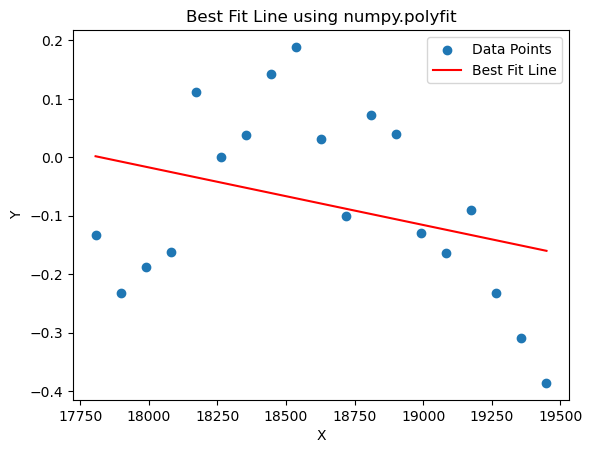

In [107]:
# Convincing myself that the calculated linear trend coefficients makes sense

# Define x and y
x = mdates.date2num(data_stacked[:,0].time)
y = data_stacked[:,0]

# Calculate coefficients of the best fit line
coefficients = np.polyfit(x, y, 1)
print(coefficients)
# Create a polynomial function
polynomial = np.poly1d(coefficients)

# Generate x values for plotting the best fit line
x_line = np.linspace(min(x), max(x), 100)

# Calculate y values for the best fit line
y_line = polynomial(x_line)

# Plot original data points
plt.scatter(x, y, label='Data Points')

# Plot best fit line
plt.plot(x_line, y_line, color='red', label='Best Fit Line')

# Add labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Best Fit Line using numpy.polyfit')
plt.legend()

# Show the plot
plt.show()

[ 1.90030517e-20 -2.50000000e-01]


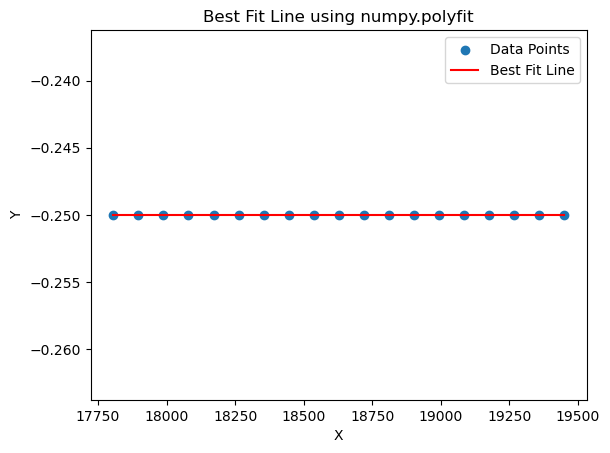

In [117]:
# Convincing myself that the calculated linear trend matches per quarter dh/dt

# Define x and y
x = mdates.date2num(data_stacked[:,0].time)
y = np.full(len(x), -0.25)

# Calculate coefficients of the best fit line
coefficients = np.polyfit(x, y, 1)
print(coefficients)
# Create a polynomial function
polynomial = np.poly1d(coefficients)

# Generate x values for plotting the best fit line
x_line = np.linspace(min(x), max(x), 100)

# Calculate y values for the best fit line
y_line = polynomial(x_line)

# Plot original data points
plt.scatter(x, y, label='Data Points')

# Plot best fit line
plt.plot(x_line, y_line, color='red', label='Best Fit Line')

# Add labels and legend
plt.xlabel('X')
plt.ylabel('Y')
plt.title('Best Fit Line using numpy.polyfit')
plt.legend()

# Show the plot
plt.show()


In [ ]:
ATL15_dhdt_bestfit = xarrayDA_pixel_timeseries_analysis(ATL15['delta_h'], linear_trend)

In [ ]:
plot_timeseries_stat(ATL15_dhdt_bestfit, 'Quarterly dh/dt best fit', 'dh/dt best fit [m/quarter]', incl_lakes=False)
plot_timeseries_stat(ATL15_dhdt_bestfit, 'Quarterly dh/dt best fit', 'dh/dt best fit [m/quarter]', incl_lakes=True)

# Explore standard deviation

In [41]:
data_stacked = ATL15.delta_h.stack(pixels = ('y', 'x'))

In [105]:
# # Apply various time series stats across time dimension directly as a method of of data_stacked xarray data array
# # DO OTHER STATS NEED DEGS OF FREEDOM KWARG?
ATL15_dhdt_mean = data_stacked.mean(dim='time')
# ATL15_dhdt_median = data_stacked.median(dim='time')
# ATL15_dhdt_std = data_stacked.std(dim='time', ddof=1)  # The ddof=1 argument is for calculating the sample standard deviation. Omit it for the population standard deviation.
# ATL15_dhdt_sum = data_stacked.sum(dim='time')
# ATL15_dhdt_min = data_stacked.min(dim='time')
# ATL15_dhdt_max = data_stacked.max(dim='time')
# ATL15_dhdt_range = ATL15_dhdt_max - ATL15_dhdt_min
# ATL15_dhdt_quantiles = data_stacked.quantile([0.10, 0.90], dim='time')

In [106]:
# # Unstacking back to original
ATL15_dhdt_mean = ATL15_dhdt_mean.unstack('pixels')
# ATL15_dhdt_median = ATL15_dhdt_median.unstack('pixels')
# ATL15_dhdt_std = ATL15_dhdt_std.unstack('pixels')
# ATL15_dhdt_sum = ATL15_dhdt_sum.unstack('pixels')
# ATL15_dhdt_min = ATL15_dhdt_min.unstack('pixels')
# ATL15_dhdt_max = ATL15_dhdt_max.unstack('pixels')
# ATL15_dhdt_range = ATL15_dhdt_range.unstack('pixels')
# ATL15_dhdt_quantiles = ATL15_dhdt_quantiles.unstack('pixels')

In [ ]:
# plot_timeseries_stat(ATL15_dhdt_std, 'ATL15_dhdt_std', 'Quarterly dh/dt standard deviation', 'dh/dt standard deviation [m/quarter]', incl_lakes=False)
plot_timeseries_stat(ATL15_dhdt_std, 'ATL15_dhdt_std', 92.5, 'Quarterly dh/dt standard deviation', 'dh/dt standard deviation [m/quarter]', incl_lakes=False)
# plot_timeseries_stat(ATL15_dhdt_std, 'ATL15_dhdt_std', 95, 'Quarterly dh/dt standard deviation', 'dh/dt standard deviation [m/quarter]', incl_lakes=True)

In [ ]:
plot_timeseries_stat(ATL1415_h_range, 'ATL1415_h_range', 92.5, 'dHeight range', 'dHeight range', incl_lakes=False)

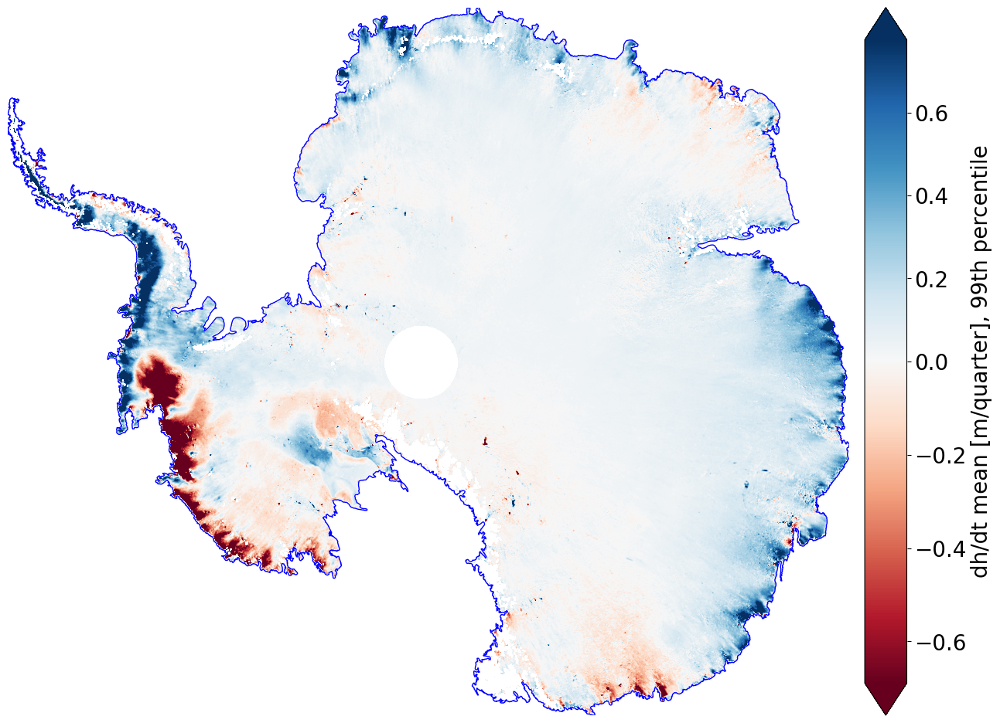

In [148]:
plot_timeseries_stat_diverging(ATL15_dhdt_mean, 'ATL15_dhdt_mean', 99, 'Quarterly dh/dt mean', 'dh/dt mean [m/quarter]', incl_lakes=False)

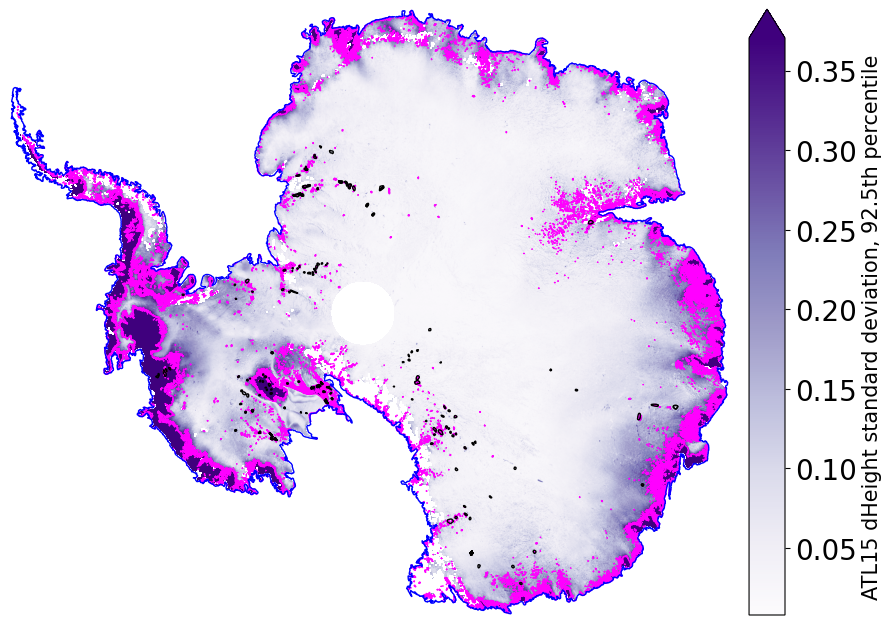

In [69]:
time_series_stat_anomalies('Antarctica', ATL15_dhdt_std, 'ATL15_dhdt_std', 92.5, 'ATL15 dHeight standard deviation')

In [ ]:
percentiles = [100, 99.95, 99.85, 99.75, 99.5, 99.25, 99, 95, 90, 85, 75, 50, 25]

for i in percentiles:     
    # plot_timeseries_stat(ATL15_dhdt_std, 'ATL15_dhdt_std', i, 'Quarterly dh/dt standard deviation', 'dh/dt standard deviation [m/quarter]', incl_lakes=False)
    plot_timeseries_stat(ATL15_dhdt_std, 'ATL15_dhdt_std', i, 'Quarterly dh/dt standard deviation', 'dh/dt standard deviation [m/quarter]', incl_lakes=True)

In [ ]:
percentiles = [100, 99.95, 99.85, 99.75, 99.5, 99.25, 99, 95, 90, 85, 75, 50, 25]

for i in percentiles:     
    plot_timeseries_stat(ATL15_dhdt_range, 'ATL15_dhdt_range', i, 'Quarterly dh/dt min-max range', 'dh/dt min-max range [m]', incl_lakes=False)
    plot_timeseries_stat(ATL15_dhdt_range, 'ATL15_dhdt_range', i, 'Quarterly dh/dt min-max range', 'dh/dt min-max range [m]', incl_lakes=True)

In [67]:
percentiles = [99.95, 99.85, 99.75, 99.5, 99.25, 99, 95, 90, 85]#, 75, 50, 25]

# Create empty dataframe to concatenate
# gdf_concatenated = gpd.GeoDataFrame(columns=['geometry', 'area (m^2)', 'perim (m)', 'centroid'])
gdf_concatenated = gpd.GeoDataFrame()

for i in percentiles: 
    gdf = time_series_stat_anomalies('Antarctica', ATL15_dhdt_std, 'ATL15_dhdt_std', i)
    print('Working on', i, 'th percentile')
    print(len(gdf), 'contours found')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
print('Complete!')
print(len(gdf_concatenated), 'total contours found')

Working on 99.95 th percentile
116 contours found
Working on 99.85 th percentile
317 contours found
Working on 99.75 th percentile
500 contours found
Working on 99.5 th percentile
1046 contours found
Working on 99.25 th percentile
1374 contours found
Working on 99 th percentile
1965 contours found
Working on 95 th percentile
17526 contours found
Working on 90 th percentile
34427 contours found
Working on 85 th percentile
54047 contours found
Complete!
111318 total contours found


In [35]:
gdf_concatenated

,geometry,area (m^2),perim (m),percentile,centroid
0,"POLYGON ((-1174260.912 -1166834.723, -1174443....",2.180983e+06,6024.114287,99.95,POINT (-1173886.883 -1167941.361)
1,"POLYGON ((-1171261.499 -1165224.346, -1172261....",1.512307e+06,5894.297330,99.95,POINT (-1171682.164 -1165688.941)
2,"POLYGON ((-1098275.788 -1157196.568, -1098456....",1.166363e+07,12932.566808,99.95,POINT (-1097471.847 -1159207.913)
3,"POLYGON ((-1167262.282 -1158134.237, -1168262....",8.331231e+06,15107.646338,99.95,POINT (-1169074.514 -1158995.742)
4,"POLYGON ((-1178260.129 -1145589.655, -1178832....",4.180041e+07,29943.633052,99.95,POINT (-1174558.548 -1149692.960)
...,...,...,...,...,...
521835,"POLYGON ((106557.865 1887062.994, 106488.354 1...",8.547632e+04,1669.514943,25.00,POINT (106464.156 1887083.755)
521836,"POLYGON ((158559.537 1891062.064, 158514.910 1...",8.764539e+06,18146.981956,25.00,POINT (158417.877 1889402.605)
521837,"POLYGON ((137604.976 1890062.297, 137482.286 1...",6.547505e+05,4061.329009,25.00,POINT (136984.100 1889567.399)
521838,"POLYGON ((154911.048 1891062.064, 154632.210 1...",7.034083e+05,3727.748025,25.00,POINT (154499.453 1890609.288)


<Axes: >

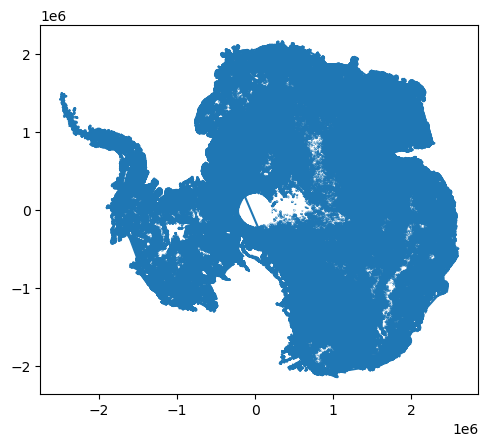

In [31]:
gdf_concatenated.boundary.plot()

In [33]:
# Define area range of previously identified lakes
min_area = SiegfriedFricker2018_outlines['area (m^2)'].min()
max_area = SiegfriedFricker2018_outlines['area (m^2)'].max()

# Compare to area covered by high std contours that are within the area range of the previously identified lakes
gdf_subset = gdf_concatenated[(gdf_concatenated['area (m^2)'] <= max_area) & (gdf_concatenated['area (m^2)'] >= min_area)]

<Axes: >

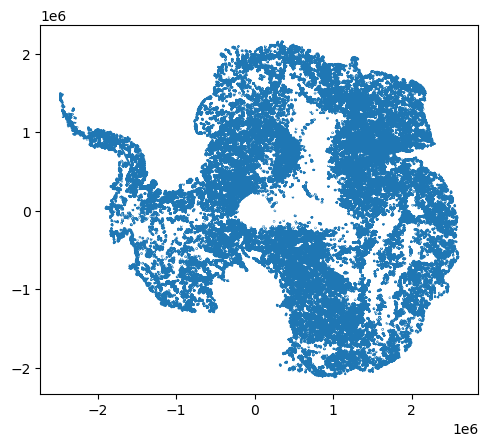

In [34]:
gdf_subset.boundary.plot()

<Axes: >

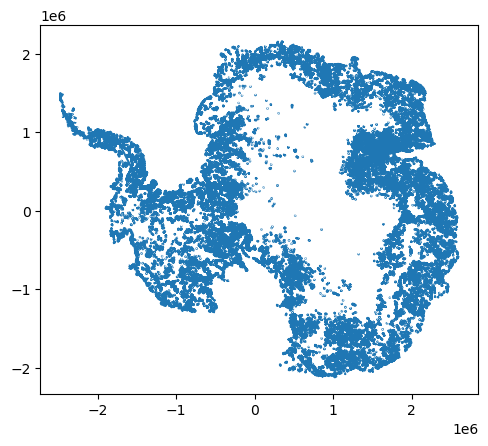

In [36]:
gdf_subset[gdf_subset.percentile > 25].boundary.plot()

<Axes: >

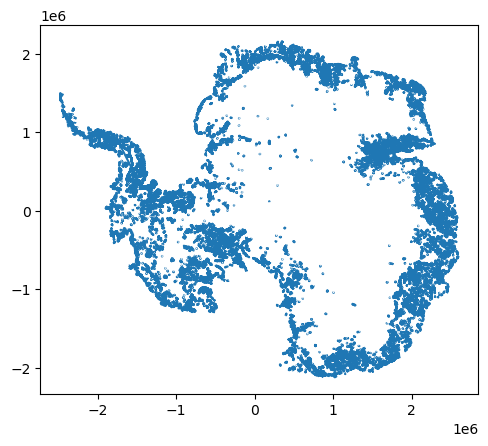

In [38]:
gdf_subset[gdf_subset.percentile > 50].boundary.plot()

<Axes: >

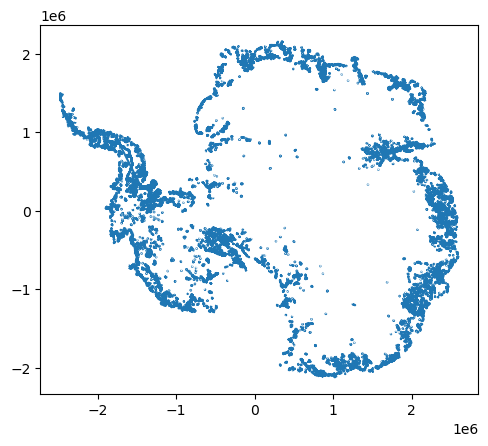

In [66]:
gdf_subset[gdf_subset.percentile > 75].boundary.plot()

In [64]:
gdf_subset[gdf_subset.percentile > 75]

,geometry,area (m^2),perim (m),percentile,centroid
4,"POLYGON ((-1178260.129 -1145589.655, -1178832....",4.180041e+07,29943.633052,99.95,POINT (-1174558.548 -1149692.960)
9,"POLYGON ((-1156639.235 -1135234.310, -1156264....",4.083880e+08,88088.788009,99.95,POINT (-1161256.273 -1121625.532)
12,"POLYGON ((-1214253.083 -1119724.096, -1215252....",2.869237e+07,21134.164918,99.95,POINT (-1214303.214 -1122853.197)
22,"POLYGON ((-1366223.331 -934221.689, -1367223.1...",1.312104e+08,62944.465867,99.95,POINT (-1362989.736 -943502.265)
28,"POLYGON ((-1403216.089 -876875.224, -1404215.8...",1.376467e+08,58161.087310,99.95,POINT (-1398807.790 -885150.799)
...,...,...,...,...,...
111207,"POLYGON ((236462.909 2109242.367, 237462.713 2...",1.117447e+08,98390.555982,85.00,POINT (248102.783 2106670.097)
111237,"POLYGON ((280454.296 2115260.522, 280848.279 2...",5.760313e+07,59184.985544,85.00,POINT (283190.873 2112800.140)
111258,"POLYGON ((296451.165 2116489.753, 296003.754 2...",4.482762e+07,49439.581476,85.00,POINT (293922.293 2112030.303)
111301,"POLYGON ((281454.101 2128708.321, 281688.674 2...",4.235223e+07,65616.893612,85.00,POINT (294932.612 2150161.385)


In [60]:
# Save geodataframe for later use
# gdf_subset[gdf_subset.percentile > 75].to_file('gdf_subset_>75thpercentile.geojson', driver='GeoJSON')
gdf_subset[gdf_subset.percentile > 75].to_parquet('gdf_subset_>75thpercentile.parquet')

# Note: This will lose the geometry column unless you convert it to WKT (Well-Known Text)
# gdf_subset[gdf_subset.percentile > 75]['geometry'] = gdf_concatenated['geometry'].apply(lambda x: x.wkt)
# gdf_subset[gdf_subset.percentile > 75].to_csv('gdf_subset_>75thpercentile.csv', index=False)

In [63]:
# Now try to open parquet file
gdf = gpd.read_parquet('/home/jovyan/gdf_subset_>75thpercentile.parquet')
gdf

,geometry,area (m^2),perim (m),percentile,centroid
4,"POLYGON ((-1178260.129 -1145589.655, -1178832....",4.180041e+07,29943.633052,99.95,POINT (-1174558.548 -1149692.960)
9,"POLYGON ((-1156639.235 -1135234.310, -1156264....",4.083880e+08,88088.788009,99.95,POINT (-1161256.273 -1121625.532)
12,"POLYGON ((-1214253.083 -1119724.096, -1215252....",2.869237e+07,21134.164918,99.95,POINT (-1214303.214 -1122853.197)
22,"POLYGON ((-1366223.331 -934221.689, -1367223.1...",1.312104e+08,62944.465867,99.95,POINT (-1362989.736 -943502.265)
28,"POLYGON ((-1403216.089 -876875.224, -1404215.8...",1.376467e+08,58161.087310,99.95,POINT (-1398807.790 -885150.799)
...,...,...,...,...,...
111207,"POLYGON ((236462.909 2109242.367, 237462.713 2...",1.117447e+08,98390.555982,85.00,POINT (248102.783 2106670.097)
111237,"POLYGON ((280454.296 2115260.522, 280848.279 2...",5.760313e+07,59184.985544,85.00,POINT (283190.873 2112800.140)
111258,"POLYGON ((296451.165 2116489.753, 296003.754 2...",4.482762e+07,49439.581476,85.00,POINT (293922.293 2112030.303)
111301,"POLYGON ((281454.101 2128708.321, 281688.674 2...",4.235223e+07,65616.893612,85.00,POINT (294932.612 2150161.385)


<Axes: >

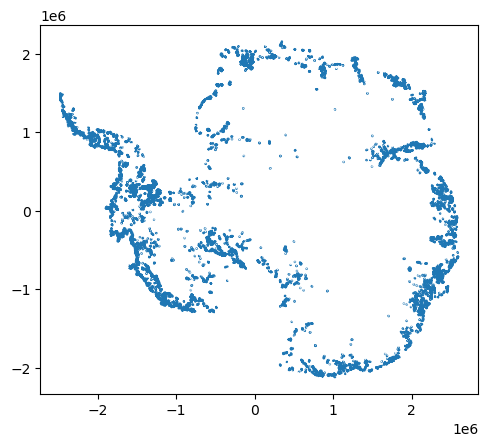

In [40]:
gdf_subset[gdf_subset.percentile > 85].boundary.plot()

In [67]:
gdf_subset[gdf_subset.percentile > 85]

,geometry,area (m^2),perim (m),percentile,centroid
4,"POLYGON ((-1178260.129 -1145589.655, -1178832....",4.180041e+07,29943.633052,99.95,POINT (-1174558.548 -1149692.960)
9,"POLYGON ((-1156639.235 -1135234.310, -1156264....",4.083880e+08,88088.788009,99.95,POINT (-1161256.273 -1121625.532)
12,"POLYGON ((-1214253.083 -1119724.096, -1215252....",2.869237e+07,21134.164918,99.95,POINT (-1214303.214 -1122853.197)
22,"POLYGON ((-1366223.331 -934221.689, -1367223.1...",1.312104e+08,62944.465867,99.95,POINT (-1362989.736 -943502.265)
28,"POLYGON ((-1403216.089 -876875.224, -1404215.8...",1.376467e+08,58161.087310,99.95,POINT (-1398807.790 -885150.799)
...,...,...,...,...,...
57024,"POLYGON ((132483.265 2092314.537, 131483.461 2...",2.227342e+07,26822.849897,90.00,POINT (133406.578 2088091.479)
57030,"POLYGON ((-204027.041 2087016.504, -204450.773...",2.928545e+07,28758.683651,90.00,POINT (-207048.715 2089986.181)
57079,"POLYGON ((379290.366 2097014.179, 378948.802 2...",2.016561e+07,23928.831355,90.00,POINT (377444.169 2093993.338)
57104,"POLYGON ((324445.684 2118564.781, 325445.488 2...",3.783714e+08,169028.083476,90.00,POINT (335180.388 2109318.664)


In [68]:
# Save geodataframe for later use
gdf_subset[gdf_subset.percentile > 85].to_parquet('lake_candidates_>lake_candidates_greaterthan85thpercentile_stddev.parquet')

In [22]:
# Open parquet file of lake candidates generated from regions with >85th percentile of ATL15 delta_h standare deviation
gdf = gpd.read_parquet('/home/jovyan/lake_candidates_greaterthan85thpercentile_stddev.parquet')
gdf

,geometry,area (m^2),perim (m),percentile,centroid
4,"POLYGON ((-1178260.129 -1145589.655, -1178832....",4.180041e+07,29943.633052,99.95,POINT (-1174558.548 -1149692.960)
9,"POLYGON ((-1156639.235 -1135234.310, -1156264....",4.083880e+08,88088.788009,99.95,POINT (-1161256.273 -1121625.532)
12,"POLYGON ((-1214253.083 -1119724.096, -1215252....",2.869237e+07,21134.164918,99.95,POINT (-1214303.214 -1122853.197)
22,"POLYGON ((-1366223.331 -934221.689, -1367223.1...",1.312104e+08,62944.465867,99.95,POINT (-1362989.736 -943502.265)
28,"POLYGON ((-1403216.089 -876875.224, -1404215.8...",1.376467e+08,58161.087310,99.95,POINT (-1398807.790 -885150.799)
...,...,...,...,...,...
57024,"POLYGON ((132483.265 2092314.537, 131483.461 2...",2.227342e+07,26822.849897,90.00,POINT (133406.578 2088091.479)
57030,"POLYGON ((-204027.041 2087016.504, -204450.773...",2.928545e+07,28758.683651,90.00,POINT (-207048.715 2089986.181)
57079,"POLYGON ((379290.366 2097014.179, 378948.802 2...",2.016561e+07,23928.831355,90.00,POINT (377444.169 2093993.338)
57104,"POLYGON ((324445.684 2118564.781, 325445.488 2...",3.783714e+08,169028.083476,90.00,POINT (335180.388 2109318.664)


In [54]:
# Remove outlines intersecting with previously identified lakes

# Perform a spatial join based on the centroid of gdf_points within gdf_polygons
# joined = gpd.sjoin(gdf_points, gdf_polygons, op='within')
joined = gdf.sjoin(SiegfriedFricker2018_outlines, how="inner", predicate='intersects')

# Extract the indices of rows in gdf_points that do not have a match in the join
rows_to_remove = joined.index

# Remove the rows from gdf_points
gdf_cleaned = gdf.drop(rows_to_remove)
print(len(gdf_cleaned))

# Assign metadata
gdf_cleaned.metadata = {
    'name': 'gdf_cleaned',
}

2861


/srv/conda/envs/notebook/lib/python3.10/site-packages/geopandas/geodataframe.py:205: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  super().__setattr__(attr, val)


In [63]:
# Making plot for AGU23 talk
from shapely.geometry import box

# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'G-H']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'Ep-F']
basin = IMBIE_basins[IMBIE_basins['NAME'] == 'Jpp-J']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'Jpp-K']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'Ap-B']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'A-Ap']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'K-A']
# basin = IMBIE_basins[IMBIE_basins['NAME'] == 'B-C']

x_min=basin.geometry.bounds.minx.values[0]
x_max=basin.geometry.bounds.maxx.values[0]
y_min=basin.geometry.bounds.miny.values[0]
y_max=basin.geometry.bounds.maxy.values[0]
buffer = 20e3

# Subset MOA imagery to region of interest using data masks
mask_x = (moa_lowres_da.x >= x_min) & (moa_lowres_da.x <= x_max)
mask_y = (moa_lowres_da.y >= y_min) & (moa_lowres_da.y <= y_max)
moa_lowres_da_sub = moa_lowres_da.where(mask_x & mask_y, drop=True)

# Subset MOA imagery to region of interest using data masks
mask_x = (vel_mag.x >= x_min) & (vel_mag.x <= x_max)
mask_y = (vel_mag.y >= y_min) & (vel_mag.y <= y_max)
vel_mag_sub = vel_mag.where(mask_x & mask_y, drop=True)

notbasin = gpd.GeoSeries(
    [box(*box(*basin.total_bounds).buffer(buffer).bounds).difference(
            basin["geometry"].values[0]
        )
    ],
    crs=basin.crs,
)

# # Create fig, ax
fig, ax = plt.subplots(figsize=(20,20))

# # Plot MOA surface imagery  
ax.imshow(moa_lowres_da_sub[0,:,:], cmap="gray", clim=[14000, 17000], extent=[x_min-buffer, x_max+buffer, y_min-buffer, y_max+buffer])
ax.imshow(vel_mag_sub, cmap='plasma', 
          norm=mpl_colors.LogNorm(),
          extent=[x_min-buffer, x_max+buffer, y_min-buffer, y_max+buffer])

# # Plot IMBIE basin outline
basin['geometry'].boundary.plot(ax=ax, color='k', linewidth=1)

# Overlay published active lake outlines for visual comparison and grounding line
Smith2009_outlines.boundary.plot(ax=ax, facecolor='cyan', linestyle=(0, (1, 3)), linewidth=1, alpha=0.5)
Smith2009_outlines.boundary.plot(ax=ax, edgecolor='cyan', linestyle=(0, (1, 3)), linewidth=2)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, facecolor='darkcyan', linestyle=(0, (1, 1)), linewidth=1, alpha=0.5)
SiegfriedFricker2018_SF18outlines.boundary.plot(ax=ax, edgecolor='darkcyan', linestyle=(0, (1, 1)), linewidth=2)
gdf_cleaned.boundary.plot(ax=ax, facecolor='midnightblue', linestyle='solid', linewidth=1, alpha=0.25)
gdf_cleaned.boundary.plot(ax=ax, edgecolor='midnightblue', linestyle='solid', linewidth=1)

Smith2009 = plt.Line2D((0, 1), (0, 0), color='cyan', linestyle=(0, (1, 5)), linewidth=5)
SiegfriedFricker2018 = plt.Line2D((0, 1), (0, 0), color='darkcyan', linestyle=(0, (1, 1)), linewidth=5)
candidates = plt.Line2D((0, 1), (0, 0), color='midnightblue', linestyle='solid', linewidth=5)

ax.legend([
    Smith2009, 
           # SiegfriedFricker2018,
           candidates
          ], 
        [
            'static outline (Smith and others, 2009)', 
         # 'static outline (Siegfried & Fricker, 2018)',
         'lake candidates (this study)',
        ], 
    loc='best')

# Put white background around basin
notbasin.plot(
    ax=ax,
    color="white",
    edgecolor="black",
    alpha=1,
    zorder=2
)

# Change polar stereographic m to km for cleaner-looking axes labels
km_scale = 1e3
ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.xaxis.set_major_formatter(ticks_x)
ticks_y = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/km_scale))
ax.yaxis.set_major_formatter(ticks_y)
# ax.set_aspect('equal')

# Label axes and set limits
ax.set_xlabel('x [km]', size=15)
ax.set_ylabel('y [km]', size=15)
ax.set(xlim=(x_min-buffer, x_max+buffer), ylim=(y_min-buffer, y_max+buffer))
ax.axis('off')

# Plot inset map to show location 
axIns = ax.inset_axes([0.005, 0.01, 0.25, 0.25]) # [left, bottom, width, height] (fractional axes coordinates)
axIns.set_aspect('equal')
moa_2014_coastline.plot(ax=axIns, color='gray', edgecolor='k', linewidth=0.1, zorder=3)
moa_2014_groundingline.plot(ax=axIns, color='ghostwhite', edgecolor='k', linewidth=0.1, zorder=3)
# rect = Rectangle((x_min, y_min), (xmax-x_min), (y_max-y_min), fill=False, linewidth=2, color='k', zorder=3)
# axIns.add_artist(rect)
basin.boundary.plot(ax=axIns, color='k', linewidth=1, zorder=3)
axIns.axis('off')

plt.show()

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
percentiles = [99.95, 99.85, 99.75, 99.5, 99.25, 99, 95, 90, 85, 75, 65, 55]

# Create empty dataframe to concatenate
# gdf_concatenated = gpd.GeoDataFrame(columns=['geometry', 'area (m^2)', 'perim (m)', 'centroid'])
gdf_concatenated = gpd.GeoDataFrame()

for idx, row in IMBIE_basins.iterrows():
    if idx > 0:  # Skip islands
        basin_name = IMBIE_basins.iloc[idx].NAME
        print('Working on:', basin_name, 'basin.')
        # subset ATL15 if needed
        # ATL15_sub = ATL15.rio.clip(IMBIE_basins[IMBIE_basins.NAME == 'G-H'].geometry.values, Scripps_landice.crs)
        ATL15_sub = ATL15.rio.clip(IMBIE_basins[IMBIE_basins.NAME == basin_name].geometry.values, Scripps_landice.crs)
        data_stacked = ATL15_sub.delta_h.stack(pixels = ('y', 'x'))
        ATL15_sub_dhdt_std = data_stacked.std(dim='time', ddof=1)
        ATL15_sub_dhdt_std = ATL15_sub_dhdt_std.unstack('pixels')
        for i in percentiles: 
            gdf = time_series_stat_anomalies(basin_name, ATL15_sub_dhdt_std, 'ATL15_dhdt_std', i)
            print('Working on', i, 'th percentile')
            print(len(gdf), 'contours found')
            # Append the new GeoDataFrame to the existing one
            gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
        print('Complete!')
        print(len(gdf_concatenated), 'total contours found')

In [43]:
gdf_concatenated

,geometry,area (m^2),perim (m),percentile,centroid
0,"POLYGON ((696376.401 1778382.697, 696119.199 1...",4.032883e+07,27244.527014,99.95,POINT (697591.167 1775316.898)
1,"POLYGON ((896244.562 1785379.343, 896208.959 1...",2.707098e+03,211.518336,99.95,POINT (896242.686 1785340.300)
2,"POLYGON ((1040149.637 1808327.887, 1039150.297...",4.944892e+06,9222.322139,99.95,POINT (1038603.243 1808114.960)
3,"POLYGON ((951208.306 1839297.797, 951201.684 1...",1.711192e+07,16312.433418,99.95,POINT (953344.482 1837227.111)
4,"POLYGON ((916231.378 1842292.232, 916230.304 1...",9.673397e-01,4.450739,99.95,POINT (916231.329 1842291.760)
...,...,...,...,...,...
848796,"POLYGON ((-261464.501 1978119.850, -261666.230...",1.433197e+05,1704.913935,55.00,POINT (-261774.906 1978161.655)
848797,"POLYGON ((-277637.109 1979118.914, -277645.288...",7.274017e+02,126.460729,55.00,POINT (-277648.509 1979110.534)
848798,"POLYGON ((-290211.929 1981117.041, -290628.272...",1.719776e+05,1779.268041,55.00,POINT (-290519.177 1981096.968)
848799,"POLYGON ((-286564.809 1988110.487, -286544.537...",1.338422e+07,16650.941645,55.00,POINT (-288381.246 1985176.518)


<Axes: >

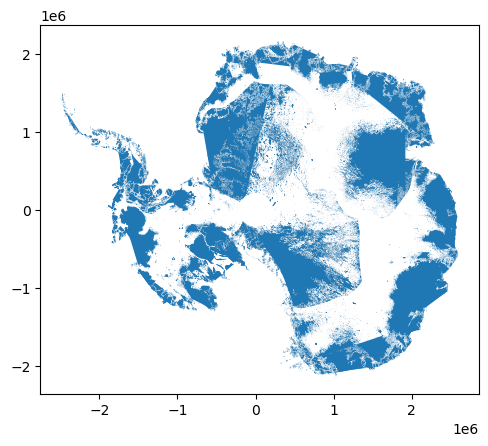

In [44]:
gdf_concatenated.plot()

# Find height change range

In [70]:
ATL1415_h_range = ATL15.h.max(dim='time') - ATL15.h.min(dim='time')

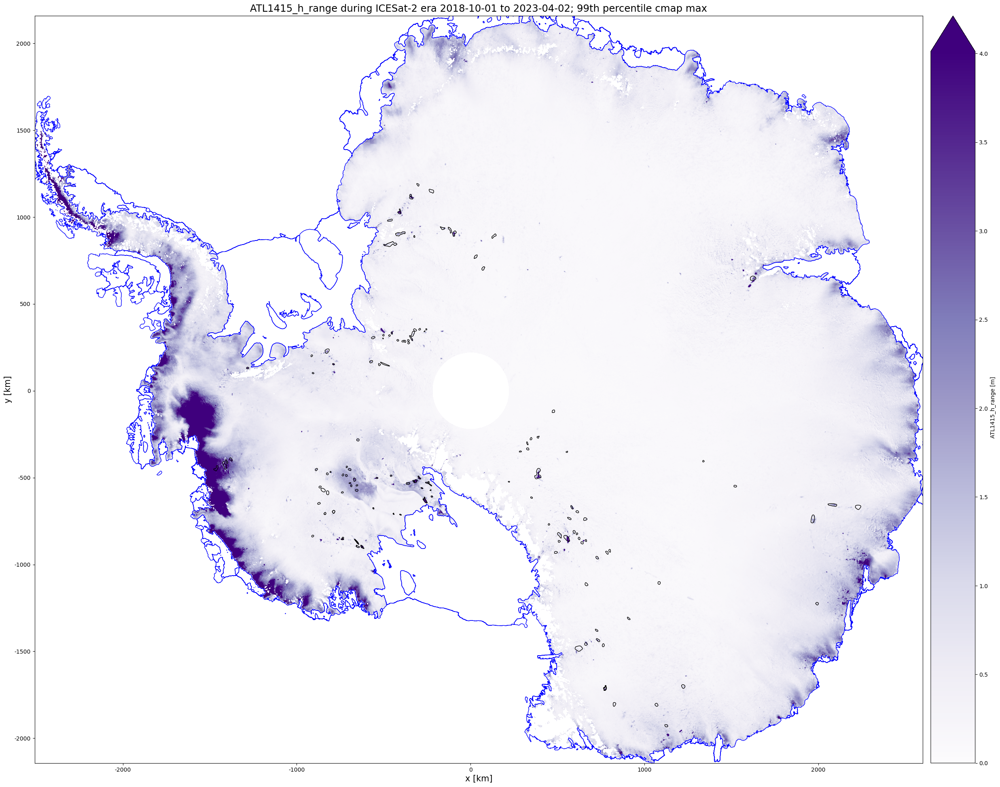

In [54]:
plot_timeseries_stat(ATL1415_h_range, 'ATL1415_h_range', 99, 'ATL1415_h_range', 'ATL1415_h_range [m]', incl_lakes=True)

In [99]:
np.nanpercentile(ATL1415_h_range, 94)

1.46820068359375

In [48]:
percentiles = [99.95,99.85,99.75,99.5,99.25,99,98,97,96,95,94,93,92,91,90,89]

# Create empty dataframe to concatenate
# gdf_concatenated = gpd.GeoDataFrame(columns=['geometry', 'area (m^2)', 'perim (m)', 'centroid'])
gdf_concatenated = gpd.GeoDataFrame()

for i in percentiles: 
    gdf = time_series_stat_anomalies('Antarctica', ATL1415_h_range, 'ATL1415_h_range', i)
    print('Working on', i, 'th percentile')
    print(len(gdf), 'contours found')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
print('Complete!')
print(len(gdf_concatenated), 'total contours found')

Working on 99.95 th percentile
101 contours found
Working on 99.85 th percentile
273 contours found
Working on 99.75 th percentile
429 contours found
Working on 99.5 th percentile
836 contours found
Working on 99.25 th percentile
1158 contours found
Working on 99 th percentile
1667 contours found
Working on 98 th percentile
5356 contours found
Working on 97 th percentile
8794 contours found
Working on 96 th percentile
12100 contours found
Working on 95 th percentile
14552 contours found
Working on 94 th percentile
16933 contours found
Working on 93 th percentile
19903 contours found
Working on 92 th percentile
22779 contours found
Working on 91 th percentile
25975 contours found
Working on 90 th percentile
28807 contours found
Working on 89 th percentile
32288 contours found
Complete!
191951 total contours found


In [49]:
gdf_concatenated

,geometry,area (m^2),perim (m),percentile,centroid
0,"POLYGON ((-1097275.984 -1158222.100, -1098275....",6.590246e+06,10053.307373,99.95,POINT (-1097551.578 -1159365.206)
1,"POLYGON ((-1169261.891 -1157821.385, -1170261....",3.988189e+06,7816.689811,99.95,POINT (-1169758.362 -1158517.972)
2,"POLYGON ((-1167886.721 -1158228.963, -1167262....",2.647766e+04,3291.878153,99.95,POINT (-1167137.161 -1158271.922)
3,"POLYGON ((-1178909.240 -1146231.753, -1179259....",2.447066e+07,26597.839845,99.95,POINT (-1174941.199 -1150482.593)
4,"POLYGON ((-1168950.881 -1151230.590, -1169261....",1.317072e+06,20619.810266,99.95,POINT (-1176823.503 -1146147.090)
...,...,...,...,...,...
191946,"POLYGON ((359438.833 2138153.495, 359165.603 2...",1.875673e+05,1880.068043,89.00,POINT (359518.769 2137944.119)
191947,"POLYGON ((346040.643 2144003.254, 346062.744 2...",2.557384e+06,6573.761334,89.00,POINT (345394.182 2143271.845)
191948,"POLYGON ((356509.180 2145003.022, 357103.357 2...",1.015586e+05,3093.065350,89.00,POINT (357017.254 2144262.632)
191949,"POLYGON ((344975.791 2150001.860, 344441.769 2...",1.271885e+06,5231.851054,89.00,POINT (344232.415 2149790.717)


<Axes: >

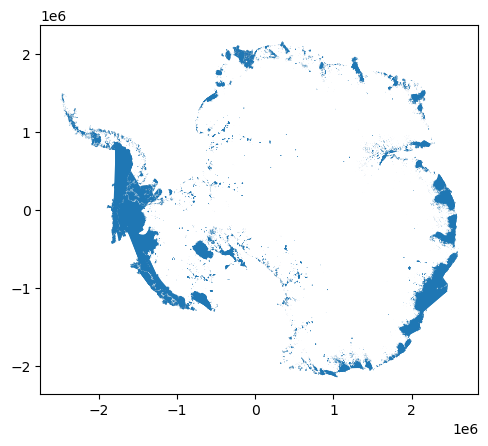

In [50]:
gdf_concatenated.plot()

In [51]:
# Plot geographic distribution
plot_time_series_stat_anomaly_gdf('Antarctica', 'ATL1415_h_range', percentiles, gdf_concatenated)

In [ ]:
# Consult lake outline inventory for max, median and min areas as possible cut off's 
# to occlude area contours with areas outside this range
print(SiegfriedFricker2018_outlines['area (m^2)'].max()/1e6)
print(SiegfriedFricker2018_outlines['area (m^2)'].median()/1e6)
print(SiegfriedFricker2018_outlines['area (m^2)'].min()/1e6)

In [ ]:
# Define area range of previously identified lakes
min_area = SiegfriedFricker2018_outlines['area (m^2)'].min()
max_area = SiegfriedFricker2018_outlines['area (m^2)'].max()

In [ ]:
# Calculate the total area of high std contours that are below the smallest previously identified lake
gdf_concatenated[gdf_concatenated['area (m^2)'] <= min_area]['area (m^2)'].sum()/1e6

In [ ]:
# Compare to area covered by high std contours that are within the area range of the previously identified lakes
gdf_concatenated[(gdf_concatenated['area (m^2)'] <= max_area) & (gdf_concatenated['area (m^2)'] >= min_area)]['area (m^2)'].sum()/1e6


In [ ]:
# Select rows where area is below the max area of previously identified lakes
gdf_subset = gdf_concatenated[gdf_concatenated['area (m^2)'] <= max_area]
print(len(gdf_subset))

In [ ]:
# Plot geographic distribution
plot_time_series_stat_anomaly_gdf('Antarctica', 'ATL1415_h_range', gdf_subset)

In [95]:
# Select rows where area is within the specified range
gdf_subset = gdf_concatenated[(gdf_concatenated['area (m^2)'] <= max_area) & (gdf_concatenated['area (m^2)'] >= min_area)]
print(len(gdf_subset))

10596


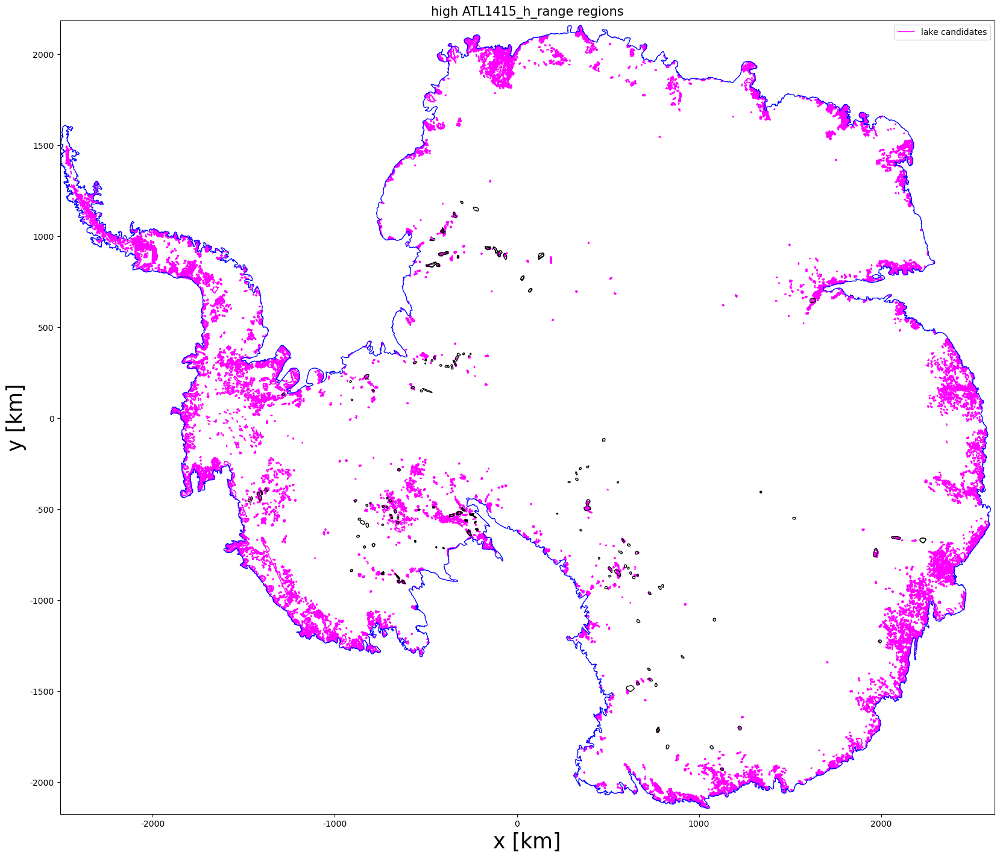

In [96]:
# Plot geographic distribution
plot_time_series_stat_anomaly_gdf('Antarctica', 'ATL1415_h_range', gdf_subset)

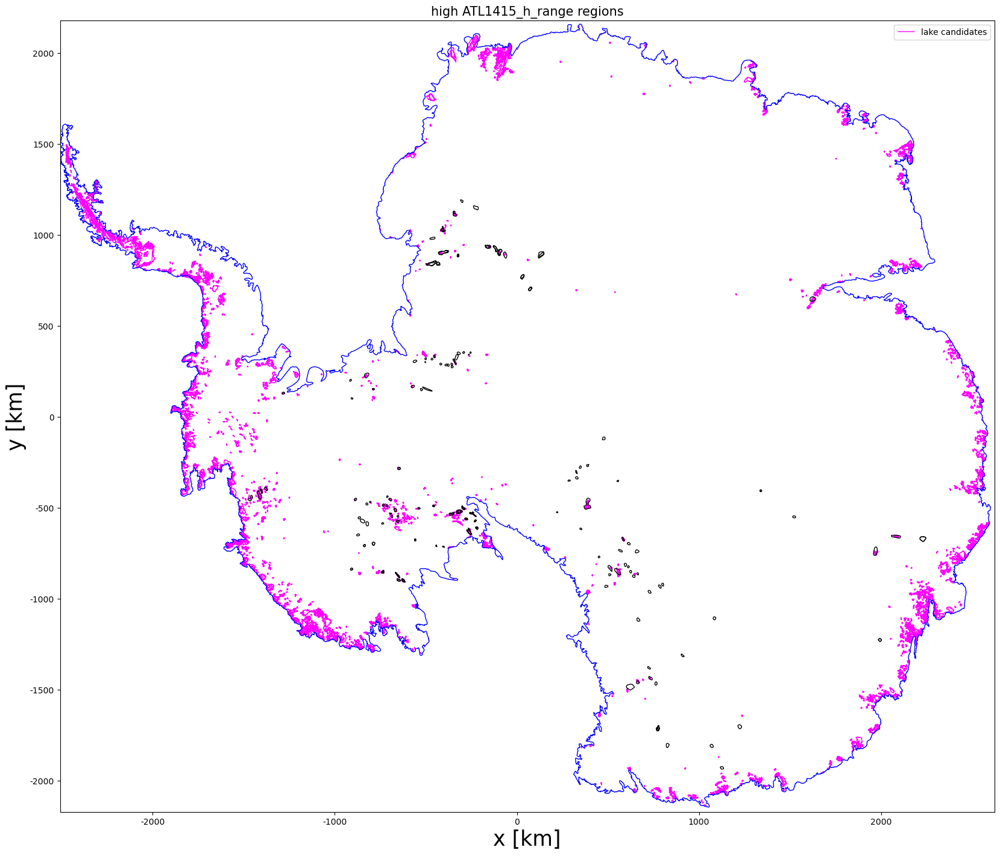

In [100]:
# Plot geographic distribution
plot_time_series_stat_anomaly_gdf('Antarctica', 'ATL1415_h_range', gdf_subset[gdf_subset.percentile > 94])

In [ ]:
percentiles = [99.95,99.85,99.75,99.5,99.25,99,98,97,96,95,94,93,92,91,90,89]

# Create empty dataframe to concatenate
gdf_concatenated = gpd.GeoDataFrame()

for idx, row in IMBIE_basins.iterrows():
    if idx > 0:  # Skip islands
        basin_name = IMBIE_basins.iloc[idx].NAME
        print('Working on:', basin_name, 'basin.')
        for i in percentiles: 
            plot_time_series_stat_anomaly_gdf(basin_name, 'ATL1415_h_range', i, gdf_subset[gdf_subset.percentile > i])
print('Complete!')

In [106]:
gdf_subset.to_parquet('gdf_subset_>89thpercentile.parquet')

# Try splitting ATL1415_h_range into quartiles and anlyzing those separately 

In [42]:
ATL1415_h_range = ATL15.h.max(dim='time') - ATL15.h.min(dim='time')

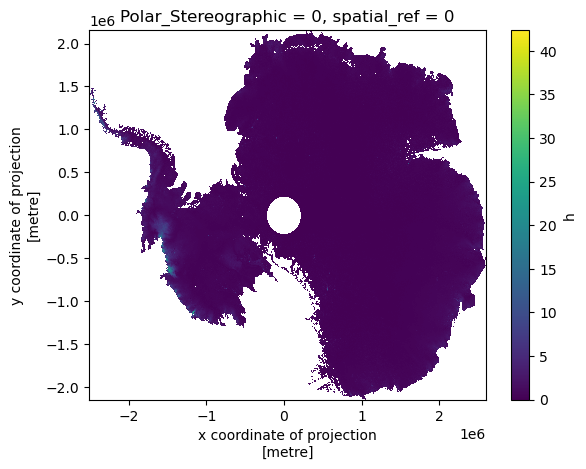

In [40]:
ATL1415_h_range.plot()

In [52]:
# Assuming you have a DataArray named 'data'
sigma_x = 5  # Standard deviation for x dimension
sigma_y = 5  # Standard deviation for y dimension
smoothed_data = low_pass_filter(ATL1415_h_range, sigma_x, sigma_y)

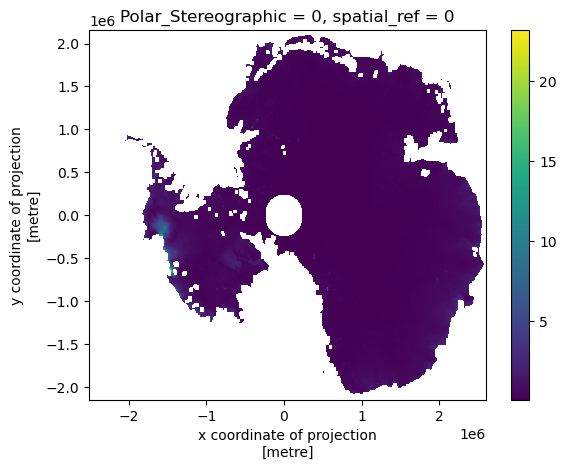

In [53]:
smoothed_data.plot()

In [46]:
def split_into_quartiles(data_array):
    """
    Splits a given xarray DataArray into four separate arrays representing each quartile.
    Values not belonging to a particular quartile are replaced with NaNs.

    Parameters:
    data_array (xarray.DataArray): The input data array.

    Returns:
    dict: A dictionary containing the four quartile arrays.
    """
    # Calculate quartile values
    q1 = data_array.quantile(0.25)
    q2 = data_array.quantile(0.50)
    q3 = data_array.quantile(0.75)

    # Create masks for each quartile
    first_quartile_mask = data_array <= q1
    second_quartile_mask = (data_array > q1) & (data_array <= q2)
    third_quartile_mask = (data_array > q2) & (data_array <= q3)
    fourth_quartile_mask = data_array > q3

    # Apply masks and replace out-of-quartile values with NaNs
    first_quartile = data_array.where(first_quartile_mask, np.nan)
    second_quartile = data_array.where(second_quartile_mask, np.nan)
    third_quartile = data_array.where(third_quartile_mask, np.nan)
    fourth_quartile = data_array.where(fourth_quartile_mask, np.nan)

    return {
        'first_quartile': first_quartile,
        'second_quartile': second_quartile,
        'third_quartile': third_quartile,
        'fourth_quartile': fourth_quartile
    }

# Example usage (assuming you have an xarray DataArray named 'data_array'):
# quartiles = split_into_quartiles(data_array)
# Now 'quartiles' is a dictionary containing the four quartile arrays.

In [47]:
quartiles = split_into_quartiles(ATL1415_h_range)

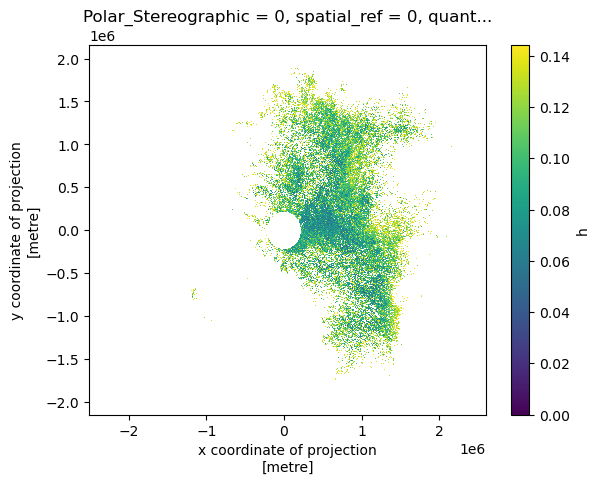

In [48]:
quartiles['first_quartile'].plot()

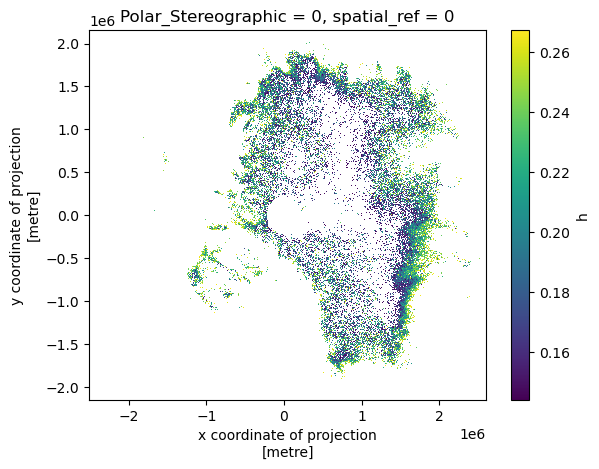

In [48]:
quartiles['second_quartile'].plot()

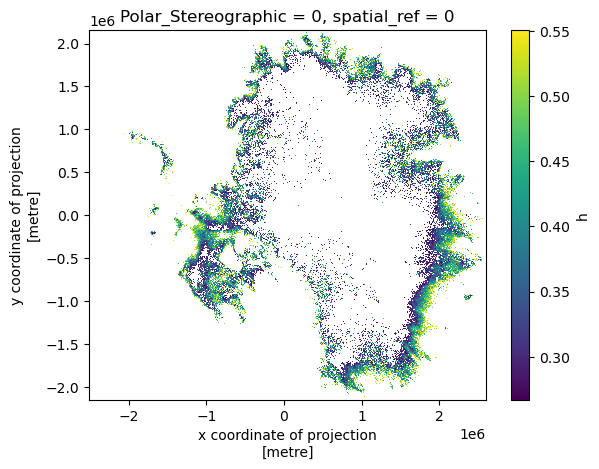

In [49]:
quartiles['third_quartile'].plot()

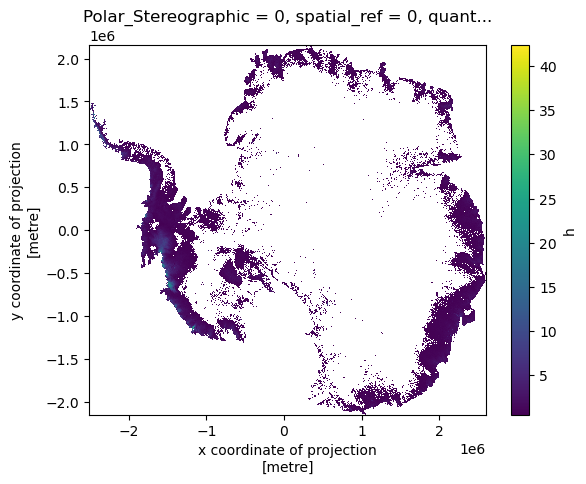

In [52]:
quartiles['fourth_quartile'].plot()

In [47]:
quartiles = split_into_quartiles(smoothed_data)

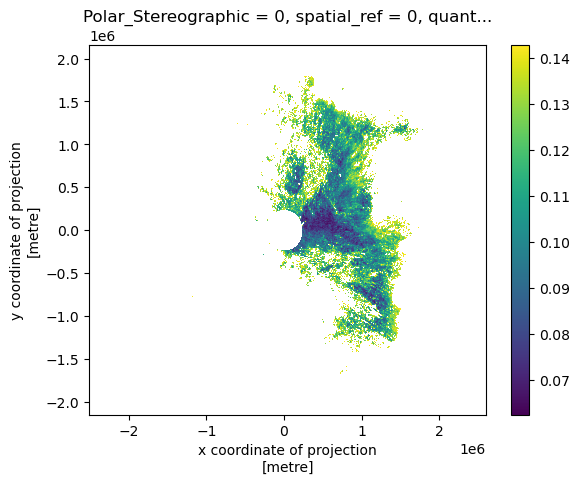

In [54]:
quartiles['first_quartile'].plot()

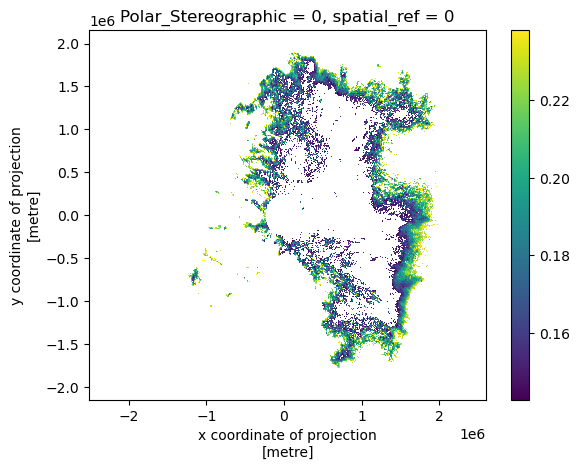

In [55]:
quartiles['second_quartile'].plot()

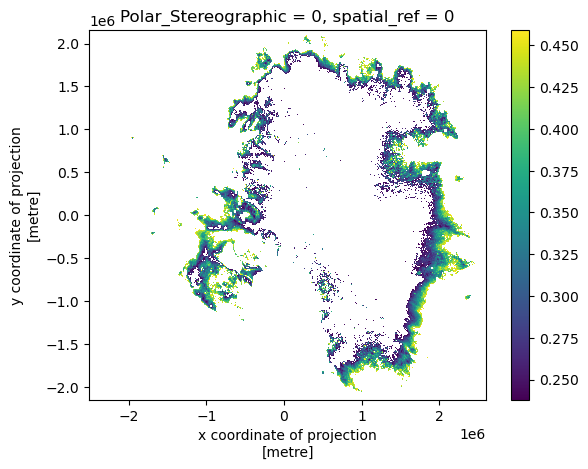

In [56]:
quartiles['third_quartile'].plot()

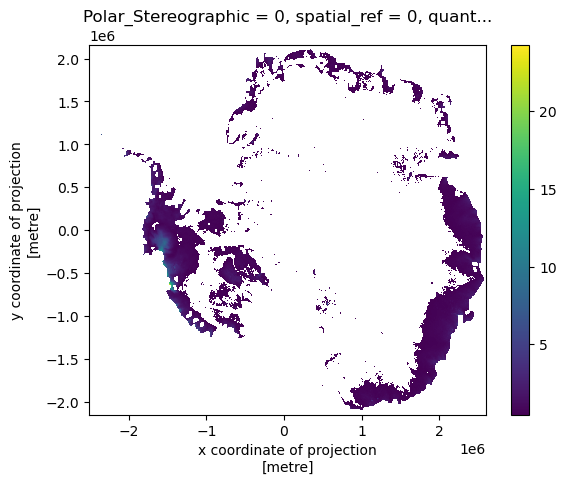

In [57]:
quartiles['fourth_quartile'].plot()

In [ ]:
np.nanpercentile(quartiles['first_quartile'], 95)

In [ ]:
# First percentile has such a small ATL1415_h_range that I will not include it in the contours geodataframe
# percentiles = [99.95,99.85,99.75,99.5,99.25,99,98,97,96,95,94,93,92,91,90,89]

# # Create empty dataframe to concatenate
# # gdf_concatenated = gpd.GeoDataFrame(columns=['geometry', 'area (m^2)', 'perim (m)', 'centroid'])
# gdf_concatenated = gpd.GeoDataFrame()

# for i in percentiles: 
#     gdf = time_series_stat_anomalies('ATL1415_h_range_secondquartile', quartiles['second_quartile'], 'ATL1415_h_range', i)
#     print('Working on', i, 'th percentile')
#     print(len(gdf), 'contours found')
#     # Append the new GeoDataFrame to the existing one
#     gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
# print('Complete!')
# print(len(gdf_concatenated), 'total contours found')

In [ ]:
percentiles = [99.95,99.85,99.75,99.5,99.25,99,98,97,96,95,94,93,92,91,90,89]

# Create empty dataframe to concatenate
gdf_concatenated = gpd.GeoDataFrame()

for i in percentiles: 
    gdf = time_series_stat_anomalies('ATL1415_h_range_secondquartile', quartiles['second_quartile'], 'ATL1415_h_range', i)
    print('Working on', i, 'th percentile')
    print(len(gdf), 'contours found')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
print('Complete!')
print(len(gdf_concatenated), 'total contours found')

In [ ]:
percentiles = [99.95,99.85,99.75,99.5,99.25,99,98,97,96,95,94,93,92,91,90,89]

for i in percentiles: 
    gdf = time_series_stat_anomalies('ATL1415_h_range_thirdquartile', quartiles['third_quartile'], 'ATL1415_h_range', i)
    print('Working on', i, 'th percentile')
    print(len(gdf), 'contours found')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
print('Complete!')
print(len(gdf_concatenated), 'total contours found')

In [ ]:
for i in percentiles: 
    gdf = time_series_stat_anomalies('ATL1415_h_range_fourthquartile', quartiles['fourth_quartile'], 'ATL1415_h_range', i)
    print('Working on', i, 'th percentile')
    print(len(gdf), 'contours found')
    # Append the new GeoDataFrame to the existing one
    gdf_concatenated = pd.concat([gdf_concatenated, gdf], ignore_index=True)
print('Complete!')
print(len(gdf_concatenated), 'total contours found')

In [ ]:
# Splitting ATL1415_h_range pixel by pixel into quartiles confuses the contouring algorithm
# Going to try drawing contour that align with quartiles

In [56]:
from skimage.measure import find_contours

def split_data_array_corrected(da, contour_value):
    """
    Split an xarray DataArray into two regions based on a contour value.

    Args:
    da (xarray.DataArray): The DataArray to split.
    contour_value (float): The value used to define the contour for splitting.

    Returns:
    tuple: Two xarray DataArrays representing the split regions.
    """

    # Ensure the data array is two-dimensional
    if da.ndim != 2:
        raise ValueError("DataArray must be 2D")

    # Find contours in the data array
    contours = find_contours(da.values, contour_value)

    # Check if any contours are found
    if not contours:
        raise ValueError("No contour found at the specified value")

    # Use the first contour found for simplicity
    contour = contours[0]

    # Create a mask for the region inside the contour
    mask = np.zeros_like(da.values, dtype=bool)
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if any(np.linalg.norm([i - y, j - x]) < 1 for x, y in contour):
                mask[i, j] = True

    # Convert mask to DataArray
    mask_da = xr.DataArray(mask, coords=da.coords, dims=da.dims)

    # Split the DataArray into two regions based on the mask
    inside_region = da.where(mask_da, drop=True)
    outside_region = da.where(~mask_da, drop=True)

    return inside_region, outside_region

In [ ]:
# Split the DataArray
inside_region, outside_region = split_data_array_corrected(ATL1415_h_range, np.nanpercentile(ATL1415_h_range, 50))

# Plotting the regions for visualization
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Inside Region")
plt.imshow(inside_region, origin='lower')
plt.colorbar()

plt.subplot(1, 2, 2)
plt.title("Outside Region")
plt.imshow(outside_region, origin='lower')
plt.colorbar()

plt.show()

# ATL dhdt best fit; low pass filter; find h_range bigger than smooth trend
Fit line to data to get dh/dt for each grid cell for long-term dh/dt; now you have map with mean dh/dt value; from there you could low pass filter (code from matt’s RS class; scipy filter; can play around with different filters) to get regional dh/dt (longwave variability or geographic smoothing); do over entire continent to get smoothed dh/dt; then left with smooth grid of dh/dt with peak range of anomaly from min/max range threshold; then how do you set threshold on min/max range that won’t include the regional dh/dt trend; threshold is in m/quarter, but we can integrate over whole time series to say must be larger than m/t of whole time series of a typical dh/dt in a region?

In [39]:
ATL1415_h_range = ATL15.h.max(dim='time') - ATL15.h.min(dim='time')

In [40]:
# Let's zoom into Amundsen Sea Embayment region
x_min = -2000000
x_max = -1250000
y_min = -1000000
y_max = -100000

In [94]:
ATL15

<xarray.Dataset>
Dimensions:              (time: 19, x: 5109, y: 4302)
Coordinates:
  * time                 (time) datetime64[ns] 2018-10-01T22:30:00 ... 2023-0...
  * x                    (x) float64 -2.507e+06 -2.506e+06 ... 2.6e+06 2.601e+06
  * y                    (y) float64 -2.143e+06 -2.142e+06 ... 2.158e+06
    Polar_Stereographic  int64 0
    spatial_ref          int64 0
Data variables:
    delta_h              (time, y, x) float32 nan nan nan nan ... nan nan nan
    h                    (time, y, x) float32 nan nan nan nan ... nan nan nan
Attributes:
    description:  delta_h group includes variables describing height differen...

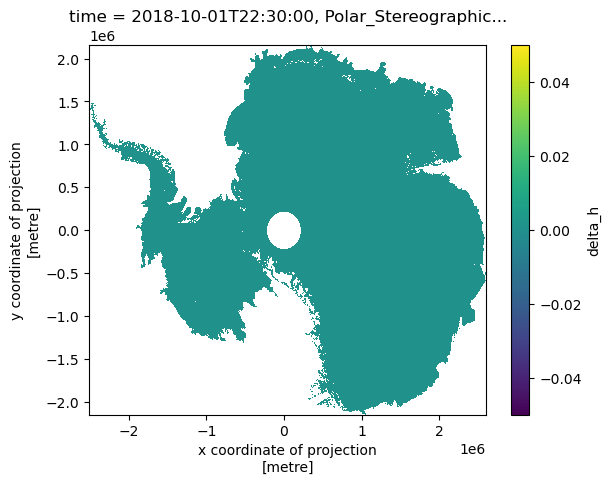

In [96]:
(ATL15.delta_h[0,:,:]-ATL15.delta_h[0,:,:]).plot()

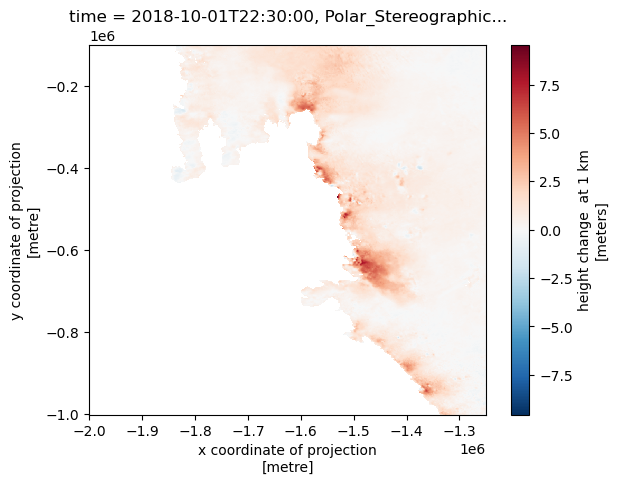

In [93]:
ATL15.delta_h.sel(x=slice(x_min, x_max), y=slice(y_min, y_max))[0,:,:].plot()

In [41]:
# First do cumsum on delta_h
dataset['dh'] = dataset['delta_h'].diff(dim='time')

# Stack x and y into a single dimension
stacked = ATL15['delta_h'].sel(x=slice(x_min, x_max), y=slice(y_min, y_max)).stack(pixels = ['x', 'y'])

# Example DataArray
# da = xr.DataArray(..., dims=["time", "lat", "lon"])
# da=ATL15.delta_h

# # Convert time to a numeric format (e.g., seconds since the start)
# numeric_time = xr.DataArray((da.time - da.time[0]).dt.total_seconds(), dims="time")

# # Function to apply linear regression
# def linear_regression_along_time(y):
#     return np.polyfit(numeric_time, y, 1)  # 1 for linear

# # Apply the function along the time dimension
# regression_coeffs = xr.apply_ufunc(
#     linear_regression_along_time, 
#     da, 
#     input_core_dims=[["time"]], 
#     vectorize=True,
#     output_dtypes=[float]
# )

# regression_coeffs now contains the slope and intercept for each pixel

# Apply linear_trend func across time dimension
timeseries_stat = stacked.groupby('pixels').apply(linear_trend)

# Unstacking back to original
timeseries_stat = timeseries_stat.unstack('pixels')


In [75]:
stacked

<xarray.DataArray 'delta_h' (time: 19, pixels: 676651)>
array([[        nan,         nan,         nan, ...,  0.0045166 ,
         0.02355957,  0.0748291 ],
       [        nan,         nan,         nan, ..., -0.18353271,
        -0.1638794 , -0.11352539],
       [        nan,         nan,         nan, ..., -0.19989014,
        -0.18109131, -0.13903809],
       ...,
       [        nan,         nan,         nan, ...,  0.36993408,
         0.3713379 ,  0.38519287],
       [        nan,         nan,         nan, ...,  0.15759277,
         0.1762085 ,  0.20684814],
       [        nan,         nan,         nan, ...,  0.03259277,
         0.0524292 ,  0.08569336]], dtype=float32)
Coordinates:
  * time                 (time) datetime64[ns] 2018-10-01T22:30:00 ... 2023-0...
    Polar_Stereographic  int64 0
    spatial_ref          int64 0
  * pixels               (pixels) object MultiIndex
  * x                    (pixels) float64 -2e+06 -2e+06 ... -1.25e+06 -1.25e+06
  * y                    (pixels) float64 -1e+06 -9.99e+05 ... -1.01e+05 -1e+05
Attributes:
    least_significant_digit:  4
    units:                    meters
    dimensions:               time,y,x
    datatype:                 float32
    description:              Height change relative to the datum (Jan 1, 202...
    long_name:                height change  at 1 km
    source:                   ATBD section 3.4
    grid_mapping:             Polar_Stereographic

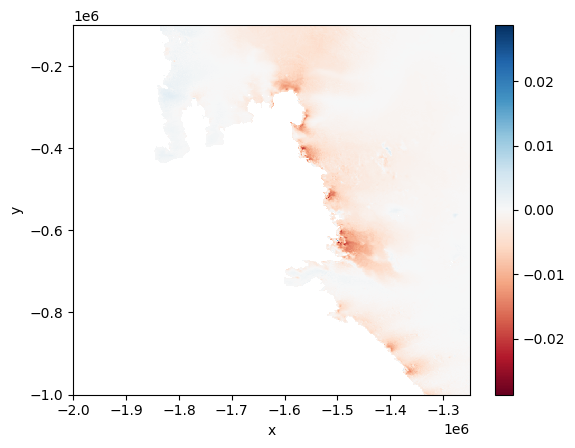

In [70]:
timeseries_stat.T.plot(cmap='RdBu')

In [71]:
# Find integrated h change using len of time series
timeseries_stat_integrated = len(ATL15.time)*timeseries_stat

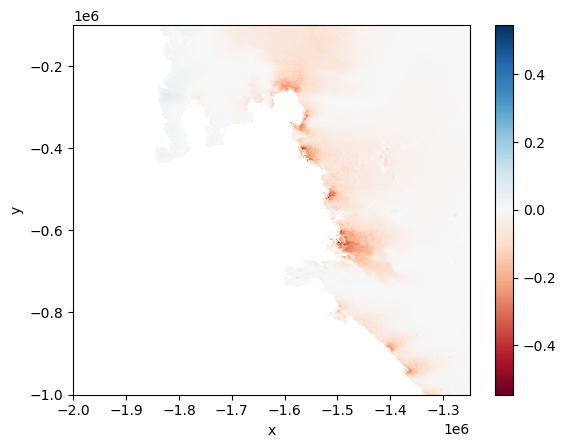

In [72]:
timeseries_stat_integrated.T.plot(cmap='RdBu')

In [53]:
# Low pass filter timeseries_stat
sigma_x = 2  # Standard deviation for x dimension
sigma_y = 2  # Standard deviation for y dimension
timeseries_stat_smoothed = low_pass_filter(timeseries_stat, sigma_x, sigma_y)

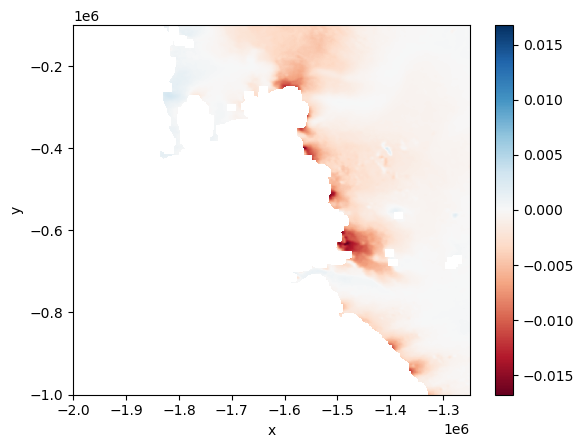

In [68]:
timeseries_stat_smoothed.T.plot(cmap='RdBu')

In [56]:
# Find integrated h change using len of time series
timeseries_stat_smoothed_integrated = len(ATL15.time)*timeseries_stat_smoothed

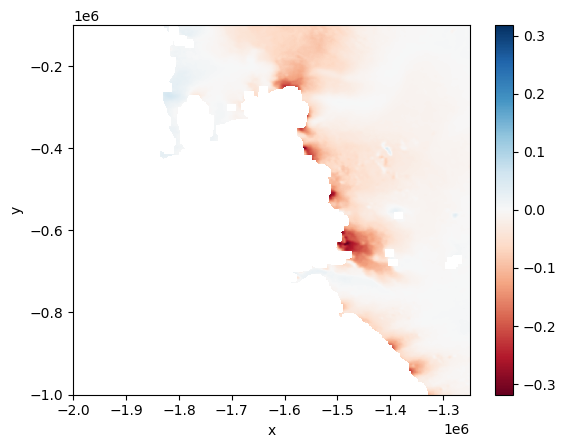

In [69]:
timeseries_stat_smoothed_integrated.T.plot(cmap='RdBu')

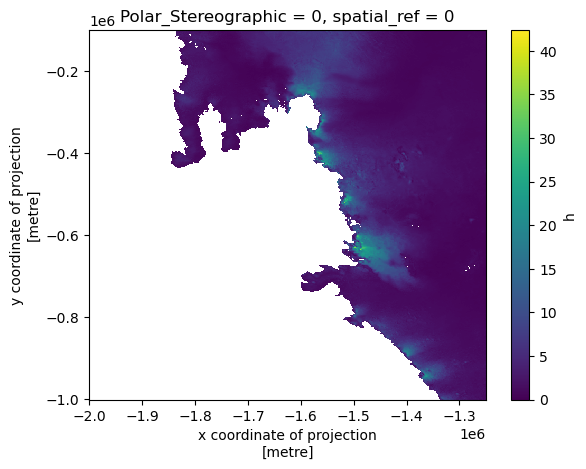

In [84]:
divnorm=mpl_colors.TwoSlopeNorm(vcenter=0.)
ATL1415_h_range.sel(x=slice(x_min, x_max), y=slice(y_min, y_max)).plot()